# Insurance Claims- Fraud Detection

#### Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/arjun0200/Datasets/main/Automobile_insurance_fraud.csv")
pd.set_option("max_rows", None)
pd.set_option("max_columns", None)

### Data Analysis

In [3]:
df.head(5)  # checking first rows of the dataset

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
df.tail(5)   # checking last rows of the dataset

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
df.sample(5)  # checking random rows of the dataset

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
528,379,54,505014,27-12-2001,IL,100/300,500,1251.16,0,447750,FEMALE,Associate,machine-op-inspct,kayaking,not-in-family,41400,0,15-02-2015,Single Vehicle Collision,Front Collision,Total Loss,Ambulance,WV,Riverwood,7041 Tree Ridge,14,1,?,0,1,NO,75960,6330,6330,63300,Jeep,Grand Cherokee,2010,N,NaN
837,9,24,326180,25-05-2002,IL,100/300,2000,1304.46,0,473349,FEMALE,PhD,machine-op-inspct,golf,other-relative,51700,-33300,31-01-2015,Vehicle Theft,?,Trivial Damage,None,NC,Arlington,6939 3rd Hwy,6,1,NO,0,3,YES,5940,540,1080,4320,Audi,A5,2001,Y,NaN
727,39,22,691115,28-01-1993,IN,500/1000,500,1173.21,0,431202,MALE,JD,farming-fishing,polo,not-in-family,0,0,14-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Police,SC,Northbend,4782 Sky Lane,14,1,YES,0,1,YES,86130,15660,7830,62640,Suburu,Legacy,2009,Y,NaN
808,135,34,824116,05-05-1998,IL,250/500,2000,1687.53,0,465674,FEMALE,JD,protective-serv,base-jumping,other-relative,0,-69600,23-01-2015,Single Vehicle Collision,Side Collision,Total Loss,Fire,NC,Northbend,2654 Embaracadero St,7,1,?,1,2,NO,78200,15640,7820,54740,Audi,A3,2009,N,NaN
52,217,39,394975,02-06-2002,IN,100/300,1000,1530.52,0,603993,MALE,College,armed-forces,basketball,not-in-family,0,0,22-02-2015,Vehicle Theft,?,Minor Damage,None,WV,Northbend,2644 Elm Drive,8,1,?,2,1,YES,4300,430,430,3440,Toyota,Corolla,2000,N,NaN


In [6]:
df.shape # checking size of the dataset

(1000, 40)

### Checking some more dataset rows for better understandings

In [7]:
df.sample(50)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
306,111,29,235869,22-01-2011,IL,250/500,500,1239.55,2000000,464736,FEMALE,PhD,farming-fishing,kayaking,own-child,0,0,09-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Fire,SC,Riverwood,2230 1st St,1,1,?,1,1,YES,52800,4800,9600,38400,Mercedes,ML350,1996,Y,NaN
85,275,41,498875,26-10-1996,OH,100/300,2000,1514.72,0,617970,MALE,High School,transport-moving,board-games,own-child,35700,0,02-02-2015,Multi-vehicle Collision,Front Collision,Major Damage,Fire,NY,Northbrook,7477 MLK Drive,13,3,YES,0,1,?,58300,5830,11660,40810,Suburu,Legacy,2007,N,NaN
781,70,29,963285,09-12-2006,IN,100/300,1000,1425.79,0,604147,FEMALE,MD,armed-forces,video-games,other-relative,62400,-52300,04-01-2015,Single Vehicle Collision,Front Collision,Minor Damage,Ambulance,NC,Riverwood,1275 4th Ridge,12,1,NO,0,3,?,69360,11560,11560,46240,Dodge,RAM,2009,N,NaN
717,38,28,447226,17-08-1994,OH,500/1000,500,1122.95,4000000,473653,MALE,Masters,priv-house-serv,golf,other-relative,78000,0,23-02-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Ambulance,WV,Northbrook,6399 Oak Drive,4,3,NO,0,3,YES,74880,12480,12480,49920,Accura,TL,2000,N,NaN
350,250,43,380067,07-07-2013,OH,500/1000,1000,1243.84,0,474848,FEMALE,JD,tech-support,polo,own-child,47900,-73400,30-01-2015,Single Vehicle Collision,Side Collision,Minor Damage,Other,VA,Columbus,5771 Sky Ave,22,1,YES,1,3,NO,64900,12980,12980,38940,Volkswagen,Jetta,2011,N,NaN
253,440,61,212674,01-09-1992,OH,250/500,500,1050.76,0,467942,MALE,PhD,transport-moving,movies,wife,41500,-70200,26-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Fire,OH,Riverwood,8821 Elm St,21,1,?,2,3,NO,53640,5960,5960,41720,Nissan,Maxima,2004,Y,NaN
885,254,45,633375,17-09-2003,IL,250/500,500,1083.64,0,614372,MALE,JD,other-service,paintball,husband,59800,0,27-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Police,NC,Columbus,7630 Rock Drive,19,3,YES,0,0,?,79680,13280,13280,53120,BMW,3 Series,2004,N,NaN
125,206,39,965768,27-07-2014,IN,250/500,1000,1302.40,6000000,603948,MALE,JD,craft-repair,dancing,unmarried,47200,-69700,17-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Ambulance,NY,Hillsdale,1598 3rd Drive,12,3,NO,2,3,YES,36300,3300,9900,23100,Ford,Escape,2013,N,NaN
51,91,27,537546,20-08-1994,IL,100/300,2000,1073.83,0,609930,FEMALE,JD,farming-fishing,polo,husband,0,0,17-01-2015,Vehicle Theft,?,Trivial Damage,None,NY,Arlington,2280 4th Ave,4,1,?,1,2,?,7260,1320,660,5280,BMW,M5,2008,N,NaN
633,142,29,890280,24-01-2010,OH,100/300,2000,1307.68,0,606942,FEMALE,MD,craft-repair,dancing,husband,0,-48500,29-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Police,NY,Columbus,1725 Solo Lane,10,1,YES,1,2,NO,54360,4530,9060,40770,Mercedes,E400,1995,Y,NaN


### Checking columns

In [8]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

### Checking Target Variables

#### Checking fraud_reported

N    753
Y    247
Name: fraud_reported, dtype: int64


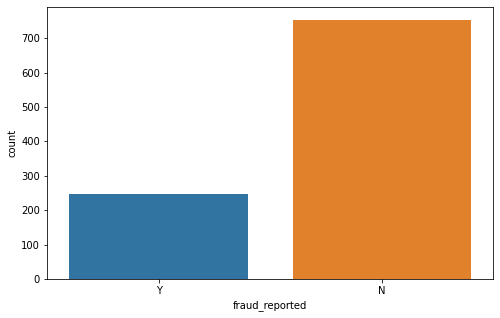

In [9]:
plt.figure(figsize = (8,5))
target = df.fraud_reported.value_counts()
print(target)
target = sns.countplot(df.fraud_reported)

### Observations of the target variable
- From above fraud_reported we can see that dataset are in imbalance count hence we need to fix it further for better performance model later

In [10]:
df.dtypes  # checking datatypes of the dataset

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

#### Observations:
   - From above code we find that 'months_as_customer', 'age', 'policy_number', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year', '_c39' these columns are of numerical types.
       
       
  - And these are object tpyes 'policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'.

In [11]:
df.info()  # checking basic summary of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [12]:
df.describe()  # checking overall summary of the dataset

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [13]:
df.describe(include = 'all')  # checking overall statiscal summary of the dataset

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
count,1000.000000,1000.000000,1000.000000,1000,1000,1000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000,1000,1000,1000,1000,1000.000000,1000.000000,1000,1000,1000,1000,1000,1000,1000,1000,1000.000000,1000.00000,1000,1000.000000,1000.000000,1000,1000.00000,1000.000000,1000.000000,1000.000000,1000,1000,1000.000000,1000,0.0
unique,NaN,NaN,NaN,951,3,3,NaN,NaN,NaN,NaN,2,7,14,20,6,NaN,NaN,60,4,4,4,5,7,7,1000,NaN,NaN,3,NaN,NaN,3,NaN,NaN,NaN,NaN,14,39,NaN,2,NaN
top,NaN,NaN,NaN,01-01-2006,OH,250/500,NaN,NaN,NaN,NaN,FEMALE,JD,machine-op-inspct,reading,own-child,NaN,NaN,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,9935 4th Drive,NaN,NaN,?,NaN,NaN,?,NaN,NaN,NaN,NaN,Saab,RAM,NaN,N,NaN
freq,NaN,NaN,NaN,3,352,351,NaN,NaN,NaN,NaN,537,161,93,64,183,NaN,NaN,28,419,292,354,292,262,157,1,NaN,NaN,360,NaN,NaN,343,NaN,NaN,NaN,NaN,80,43,NaN,753,NaN
mean,203.954000,38.948000,546238.648000,NaN,NaN,NaN,1136.000000,1256.406150,1.101000e+06,501214.488000,NaN,NaN,NaN,NaN,NaN,25126.100000,-26793.700000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.644000,1.83900,NaN,0.992000,1.487000,NaN,52761.94000,7433.420000,7399.570000,37928.950000,NaN,NaN,2005.103000,NaN,NaN
std,115.113174,9.140287,257063.005276,NaN,NaN,NaN,611.864673,244.167395,2.297407e+06,71701.610941,NaN,NaN,NaN,NaN,NaN,27872.187708,28104.096686,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.951373,1.01888,NaN,0.820127,1.111335,NaN,26401.53319,4880.951853,4824.726179,18886.252893,NaN,NaN,6.015861,NaN,NaN
min,0.000000,19.000000,100804.000000,NaN,NaN,NaN,500.000000,433.330000,-1.000000e+06,430104.000000,NaN,NaN,NaN,NaN,NaN,0.000000,-111100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1.00000,NaN,0.000000,0.000000,NaN,100.00000,0.000000,0.000000,70.000000,NaN,NaN,1995.000000,NaN,NaN
25%,115.750000,32.000000,335980.250000,NaN,NaN,NaN,500.000000,1089.607500,0.000000e+00,448404.500000,NaN,NaN,NaN,NaN,NaN,0.000000,-51500.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,1.00000,NaN,0.000000,1.000000,NaN,41812.50000,4295.000000,4445.000000,30292.500000,NaN,NaN,2000.000000,NaN,NaN
50%,199.500000,38.000000,533135.000000,NaN,NaN,NaN,1000.000000,1257.200000,0.000000e+00,466445.500000,NaN,NaN,NaN,NaN,NaN,0.000000,-23250.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,1.00000,NaN,1.000000,1.000000,NaN,58055.00000,6775.000000,6750.000000,42100.000000,NaN,NaN,2005.000000,NaN,NaN
75%,276.250000,44.000000,759099.750000,NaN,NaN,NaN,2000.000000,1415.695000,0.000000e+00,603251.000000,NaN,NaN,NaN,NaN,NaN,51025.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.000000,3.00000,NaN,2.000000,2.000000,NaN,70592.50000,11305.000000,10885.000000,50822.500000,NaN,NaN,2010.000000,NaN,NaN


<AxesSubplot:>

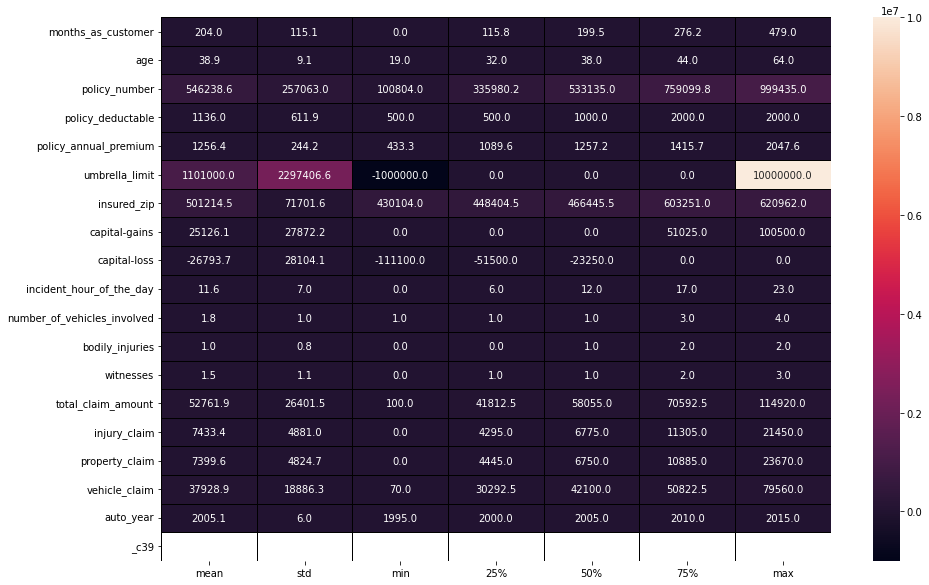

In [14]:
plt.figure(figsize = (15,10))
sns.heatmap(df.describe()[1:].transpose(), linewidths = 1, linecolor = 'black', annot = True, fmt = '.1f' )

#### From above observations we find that umbrella_limit maximum values are very much higher than its overall dataset hence this column dataset prbably having outliers.

#### 

### Checking Null Values

In [15]:
df.isnull().sum()/len(df)*100  # checking null values with percentage

months_as_customer               0.0
age                              0.0
policy_number                    0.0
policy_bind_date                 0.0
policy_state                     0.0
policy_csl                       0.0
policy_deductable                0.0
policy_annual_premium            0.0
umbrella_limit                   0.0
insured_zip                      0.0
insured_sex                      0.0
insured_education_level          0.0
insured_occupation               0.0
insured_hobbies                  0.0
insured_relationship             0.0
capital-gains                    0.0
capital-loss                     0.0
incident_date                    0.0
incident_type                    0.0
collision_type                   0.0
incident_severity                0.0
authorities_contacted            0.0
incident_state                   0.0
incident_city                    0.0
incident_location                0.0
incident_hour_of_the_day         0.0
number_of_vehicles_involved      0.0
p

<AxesSubplot:>

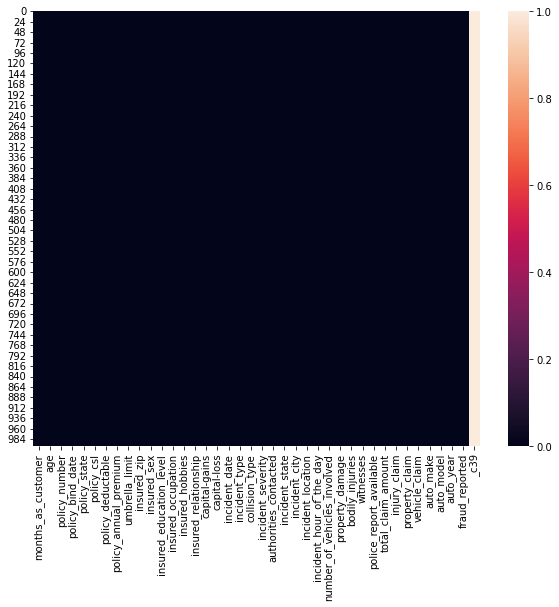

In [16]:
plt.figure(figsize = (10,8))
sns.heatmap(df.isnull())

#### As per above null value information we find that column _c39 having all rows with null NaN values hence we need to drop it.

In [17]:
df.drop('_c39', inplace = True, axis = 1)

In [18]:
df.isnull().sum()/len(df)  # checking null values with percentage

months_as_customer             0.0
age                            0.0
policy_number                  0.0
policy_bind_date               0.0
policy_state                   0.0
policy_csl                     0.0
policy_deductable              0.0
policy_annual_premium          0.0
umbrella_limit                 0.0
insured_zip                    0.0
insured_sex                    0.0
insured_education_level        0.0
insured_occupation             0.0
insured_hobbies                0.0
insured_relationship           0.0
capital-gains                  0.0
capital-loss                   0.0
incident_date                  0.0
incident_type                  0.0
collision_type                 0.0
incident_severity              0.0
authorities_contacted          0.0
incident_state                 0.0
incident_city                  0.0
incident_location              0.0
incident_hour_of_the_day       0.0
number_of_vehicles_involved    0.0
property_damage                0.0
bodily_injuries     

In [19]:
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [20]:
for i in df.columns:
    print(i, df[i].unique().shape)

months_as_customer (391,)
age (46,)
policy_number (1000,)
policy_bind_date (951,)
policy_state (3,)
policy_csl (3,)
policy_deductable (3,)
policy_annual_premium (991,)
umbrella_limit (11,)
insured_zip (995,)
insured_sex (2,)
insured_education_level (7,)
insured_occupation (14,)
insured_hobbies (20,)
insured_relationship (6,)
capital-gains (338,)
capital-loss (354,)
incident_date (60,)
incident_type (4,)
collision_type (4,)
incident_severity (4,)
authorities_contacted (5,)
incident_state (7,)
incident_city (7,)
incident_location (1000,)
incident_hour_of_the_day (24,)
number_of_vehicles_involved (4,)
property_damage (3,)
bodily_injuries (3,)
witnesses (4,)
police_report_available (3,)
total_claim_amount (763,)
injury_claim (638,)
property_claim (626,)
vehicle_claim (726,)
auto_make (14,)
auto_model (39,)
auto_year (21,)
fraud_reported (2,)


In [21]:
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


## From above dataset analysis we find that dataset still having NULL values with ? symbol which means unknown

In [22]:
df.replace('?', np.NaN, inplace = True)

## Checking Null Values again

In [23]:
df.isnull().sum()/len(df)*100  # checking null values with percentage

months_as_customer              0.0
age                             0.0
policy_number                   0.0
policy_bind_date                0.0
policy_state                    0.0
policy_csl                      0.0
policy_deductable               0.0
policy_annual_premium           0.0
umbrella_limit                  0.0
insured_zip                     0.0
insured_sex                     0.0
insured_education_level         0.0
insured_occupation              0.0
insured_hobbies                 0.0
insured_relationship            0.0
capital-gains                   0.0
capital-loss                    0.0
incident_date                   0.0
incident_type                   0.0
collision_type                 17.8
incident_severity               0.0
authorities_contacted           0.0
incident_state                  0.0
incident_city                   0.0
incident_location               0.0
incident_hour_of_the_day        0.0
number_of_vehicles_involved     0.0
property_damage             

<AxesSubplot:>

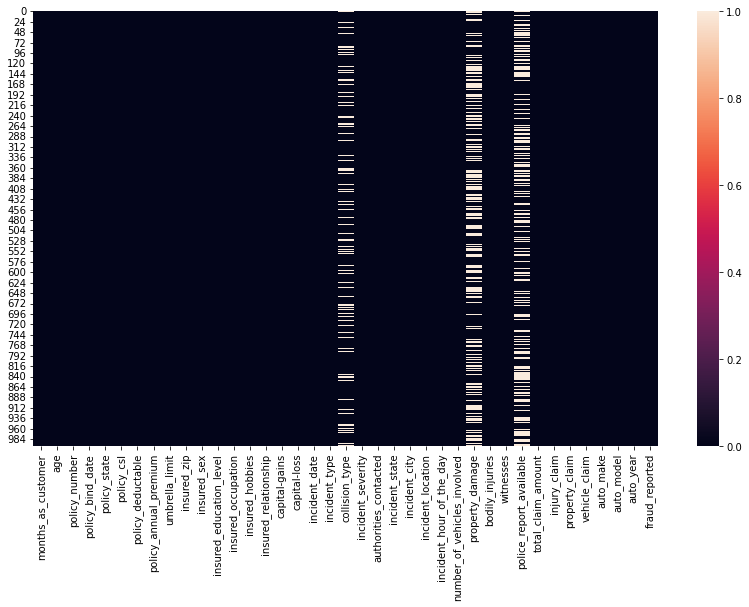

In [24]:
plt.figure(figsize = (14,8))
sns.heatmap(df.isnull())

In [25]:
df.isna().any()[lambda x: x]

collision_type             True
property_damage            True
police_report_available    True
dtype: bool

#### From above observations we find that collision_type, property_damage and police_report_available having NULL values

### Checking duplicated values

In [26]:
df.duplicated().sum() # duplicate values counts of the dataset 

0

## Dealing with NaN values

### Checking Collision_type

In [27]:
df[df['incident_type'] == 'Vehicle Theft'] # checking vehicle theft according to collision type

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,NaN,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NaN,0,0,NaN,5070,780,780,3510,Mercedes,E400,2007,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,NaN,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
27,202,34,608513,18-07-2002,IN,100/300,500,848.07,3000000,607730,MALE,JD,exec-managerial,chess,not-in-family,31000,-30200,07-01-2015,Vehicle Theft,NaN,Minor Damage,None,VA,Northbrook,3790 Andromedia Hwy,5,1,YES,2,1,NaN,5720,1040,520,4160,Suburu,Forrestor,2003,Y
48,175,34,866931,07-01-2008,IN,500/1000,1000,1123.87,8000000,446326,FEMALE,PhD,protective-serv,dancing,other-relative,0,0,26-02-2015,Vehicle Theft,NaN,Trivial Damage,Police,NY,Arlington,6619 Flute Ave,5,1,NaN,2,0,YES,7290,810,810,5670,Volkswagen,Passat,1995,N
51,91,27,537546,20-08-1994,IL,100/300,2000,1073.83,0,609930,FEMALE,JD,farming-fishing,polo,husband,0,0,17-01-2015,Vehicle Theft,NaN,Trivial Damage,None,NY,Arlington,2280 4th Ave,4,1,NaN,1,2,NaN,7260,1320,660,5280,BMW,M5,2008,N
52,217,39,394975,02-06-2002,IN,100/300,1000,1530.52,0,603993,MALE,College,armed-forces,basketball,not-in-family,0,0,22-02-2015,Vehicle Theft,NaN,Minor Damage,None,WV,Northbend,2644 Elm Drive,8,1,NaN,2,1,YES,4300,430,430,3440,Toyota,Corolla,2000,N
78,194,39,627540,21-05-2010,OH,500/1000,1000,1489.24,6000000,608335,FEMALE,JD,other-service,kayaking,wife,0,-45000,24-01-2015,Vehicle Theft,NaN,Minor Damage,None,SC,Springfield,7877 Sky Lane,15,1,YES,2,2,YES,8060,1240,1240,5580,Saab,95,2004,N
81,244,40,645258,04-07-1997,OH,500/1000,2000,1267.81,5000000,603123,FEMALE,Masters,exec-managerial,video-games,wife,0,0,03-01-2015,Vehicle Theft,NaN,Trivial Damage,None,NC,Northbrook,7098 Lincoln Hwy,10,1,NaN,2,1,NaN,6600,660,1320,4620,Accura,TL,2005,N
82,78,29,694662,15-02-2011,IL,250/500,1000,1234.20,6000000,457767,MALE,Masters,other-service,bungie-jumping,other-relative,0,0,29-01-2015,Vehicle Theft,NaN,Minor Damage,Police,NY,Northbrook,5124 Maple St,3,1,YES,2,2,NO,7500,750,1500,5250,Nissan,Maxima,2002,N
83,200,35,960680,21-08-1994,IN,250/500,2000,1318.06,0,618498,MALE,High School,exec-managerial,video-games,wife,57300,-80600,19-01-2015,Vehicle Theft,NaN,Trivial Damage,None,VA,Hillsdale,2333 Maple Lane,13,1,NO,0,3,YES,6490,1180,1180,4130,Volkswagen,Jetta,2002,N


### As we can see above dataframe is of NULL values of collision type but in there dataframe having incident type VEHICLE THEFT. But there is no information provided that whole vehicle theft or some equipment theft. Hence we are making two dataframe with one is None i.e (whole vehice theft) and other one is mode method to fill NaN values.

In [28]:
df_for_collision_type = df.copy()  # copying new dataframe for no disturbance in original dataset.

In [29]:
df_for_collision_type.loc[(df_for_collision_type["incident_type"] == "Vehicle Theft") & (df_for_collision_type["collision_type"].isnull()), 'collision_type'] = 'None'

<AxesSubplot:xlabel='collision_type', ylabel='count'>

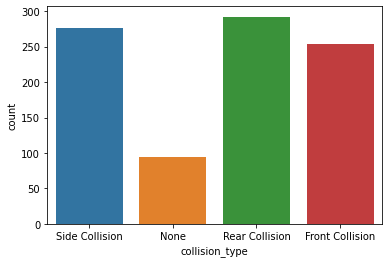

In [30]:
sns.countplot(df_for_collision_type['collision_type'])

### From above observations we find that making a new variable in a column dataset may distribute other details of dataframe hence we are not selecting it.

In [31]:
df_mode = df.copy()  #copying new dataframe for no disturbance in original dataset.

In [32]:
df['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

In [33]:
df_mode['collision_type'] = df_mode['collision_type'].fillna(df_mode['collision_type'].mode()[0]) 

In [34]:
df_mode['collision_type'].value_counts()

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

#### Effect on main DataFrame

<AxesSubplot:xlabel='collision_type', ylabel='count'>

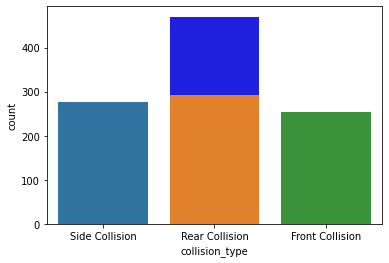

In [35]:
sns.countplot(df_mode['collision_type'], color = 'blue')
sns.countplot(df['collision_type'])

In [36]:
df['collision_type'] = df['collision_type'].fillna(df_mode['collision_type'].mode()[0]) # we are selecting this because of similar variable in dataset

In [37]:
df['collision_type'].isnull().sum()

0

### Checking property_damage            

In [38]:
df_mode['property_damage'] = df_mode['property_damage'].fillna(df_mode['property_damage'].mode()[0]) 

In [39]:
df_mode['property_damage'].value_counts()

NO     698
YES    302
Name: property_damage, dtype: int64

<AxesSubplot:xlabel='property_damage', ylabel='count'>

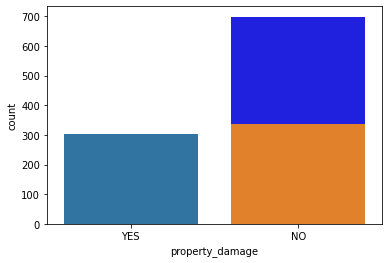

In [40]:
sns.countplot(df_mode['property_damage'], color = 'blue')
sns.countplot(df['property_damage'])

In [41]:
df['property_damage'] = df['property_damage'].fillna(df['property_damage'].mode()[0]) # we are selecting this because of similar variable in dataset

In [42]:
df['property_damage'].isnull().sum()

0

### Checking police_report_available    

In [43]:
df_mode['police_report_available'] = df_mode['police_report_available'].fillna(df_mode['police_report_available'].mode()[0]) 

In [44]:
df_mode['police_report_available'].value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

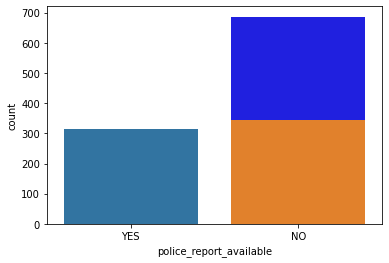

In [45]:
sns.countplot(df_mode['police_report_available'], color = 'blue')
sns.countplot(df['police_report_available'])

In [46]:
df['police_report_available'] = df['police_report_available'].fillna(df['police_report_available'].mode()[0])  # we are selecting this because of similar variable in dataset

In [47]:
df['police_report_available'].isnull().sum()

0

<AxesSubplot:>

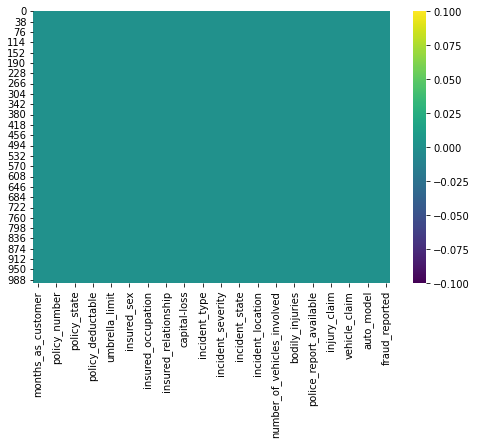

In [48]:
plt.figure(figsize = (8,5))
sns.heatmap(df.isnull(), cmap = 'viridis')

## Exploratory Data Analysis

In [49]:
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])
df['incident_date'] = pd.to_datetime(df['incident_date'])

In [50]:
df.dtypes # checking datatypes

months_as_customer                      int64
age                                     int64
policy_number                           int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted             

In [51]:
df['policy_bind_month'] = df['policy_bind_date'].dt.month   # extracting important date things
df['policy_bind_year'] = df['policy_bind_date'].dt.year

In [52]:
df['incident_date_month'] = df['incident_date'].dt.month   # extracting important date things
df['incident_date_year'] = df['incident_date'].dt.year

In [53]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month,incident_date_year
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,10,2014,1,2015
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,6,2006,1,2015
2,134,29,687698,2000-06-09,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,6,2000,2,2015
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-10-01,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,5,1990,10,2015
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,2014,2,2015


In [54]:
df.incident_date_year.unique() # we are going to dropping this column because we didn't find any machine learning information in it.

array([2015], dtype=int64)

### Dropping Columns which are not liable in model learning

#### From above dataset we find that policy_number, incident location, insured_zip are the unique values of the location and  identification of the customer hence these dataset are liable in prediction hence we need to drop it.

#### We extracted all important details from incident date and policy bind date hence we can drop it.

In [55]:
df.drop(['policy_number', 'policy_bind_date', 'incident_location', 'incident_date_year','incident_date','insured_zip'], inplace = True, axis = 1)

In [56]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,10,2014,1
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,6,2006,1
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,6,2000,2
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,5,1990,10
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,2014,2


In [57]:
for i in df.columns:
    print(i, "\n", df[i].nunique())

months_as_customer 
 391
age 
 46
policy_state 
 3
policy_csl 
 3
policy_deductable 
 3
policy_annual_premium 
 991
umbrella_limit 
 11
insured_sex 
 2
insured_education_level 
 7
insured_occupation 
 14
insured_hobbies 
 20
insured_relationship 
 6
capital-gains 
 338
capital-loss 
 354
incident_type 
 4
collision_type 
 3
incident_severity 
 4
authorities_contacted 
 5
incident_state 
 7
incident_city 
 7
incident_hour_of_the_day 
 24
number_of_vehicles_involved 
 4
property_damage 
 2
bodily_injuries 
 3
witnesses 
 4
police_report_available 
 2
total_claim_amount 
 763
injury_claim 
 638
property_claim 
 626
vehicle_claim 
 726
auto_make 
 14
auto_model 
 39
auto_year 
 21
fraud_reported 
 2
policy_bind_month 
 12
policy_bind_year 
 26
incident_date_month 
 12


In [58]:
df['umbrella_limit'].unique() 

# from above observations we find that umbrella limit shows very higher values in dataset,
# we observe that this dataset has unique values hence we convert it into object.

array([       0,  5000000,  6000000,  4000000,  3000000,  8000000,
        7000000,  9000000, 10000000, -1000000,  2000000], dtype=int64)

In [59]:
df['umbrella_limit'] = df['umbrella_limit'].astype('object')

### Dividing columns into object and numerical categories for easy visualization understandings

In [60]:
df_object = df.select_dtypes(include = 'object').columns  # object dataset columns
df_num = df.select_dtypes(exclude = 'object').columns  # numerical dataset columns

In [61]:
df_object  # checking object columns

Index(['policy_state', 'policy_csl', 'umbrella_limit', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'property_damage', 'police_report_available',
       'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

In [62]:
df_num  # checking non object columns

Index(['months_as_customer', 'age', 'policy_deductable',
       'policy_annual_premium', 'capital-gains', 'capital-loss',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_month',
       'policy_bind_year', 'incident_date_month'],
      dtype='object')

In [63]:
df.head(5)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,10,2014,1
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,6,2006,1
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,6,2000,2
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,5,1990,10
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,2014,2


### Univariate Analysis

In [64]:
for i in df_object:
    print("--------------"+i+"---------------------",'\n' ,df[i].value_counts(), "\n")  # checking unique counts

--------------policy_state--------------------- 
 OH    352
IL    338
IN    310
Name: policy_state, dtype: int64 

--------------policy_csl--------------------- 
 250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64 

--------------umbrella_limit--------------------- 
  0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64 

--------------insured_sex--------------------- 
 FEMALE    537
MALE      463
Name: insured_sex, dtype: int64 

--------------insured_education_level--------------------- 
 JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64 

--------------insured_occupation--------------------- 
 machine-op-inspct    93
prof-specialty       85
tech-support         78
s

### Bar plot

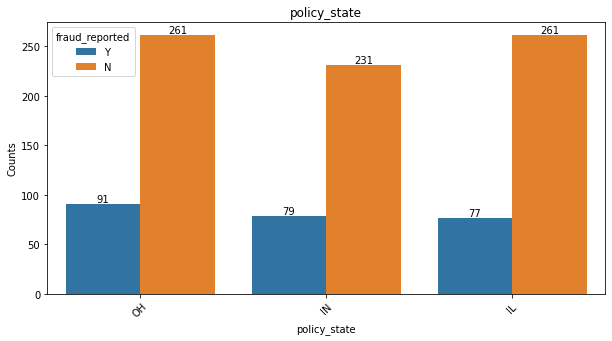

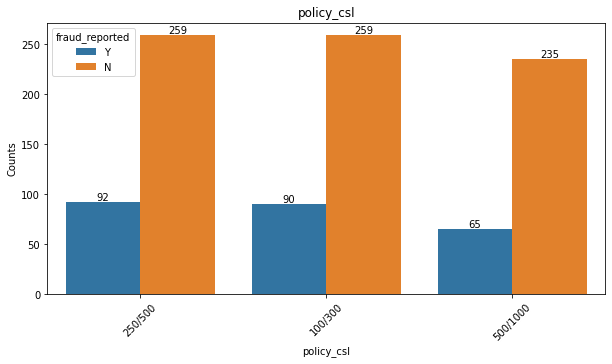

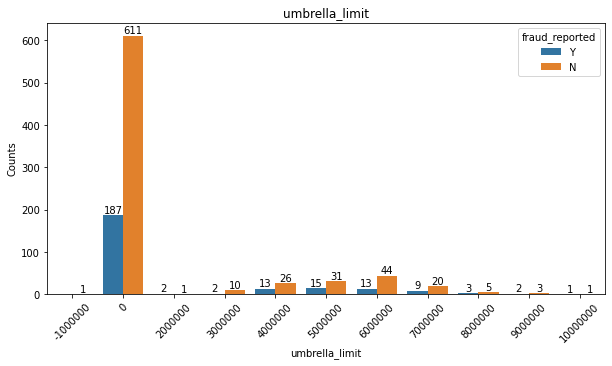

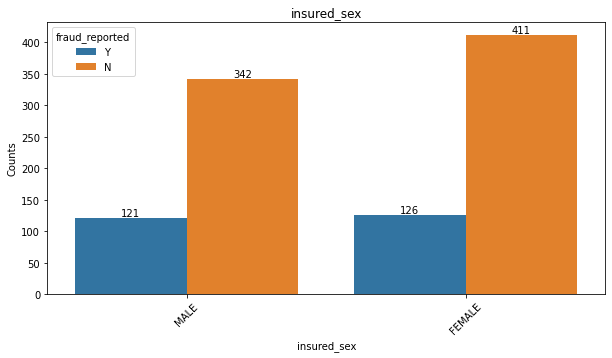

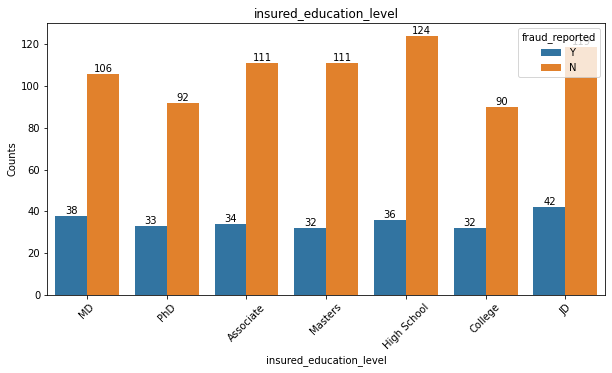

...

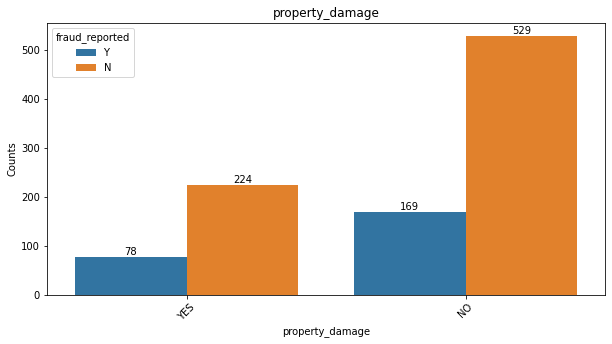

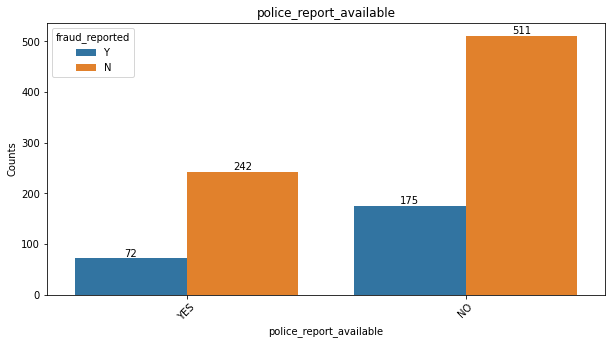

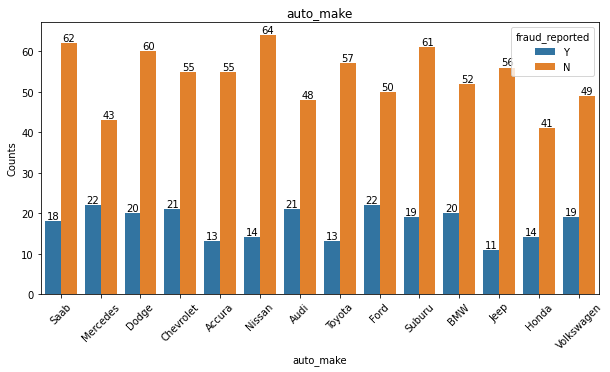

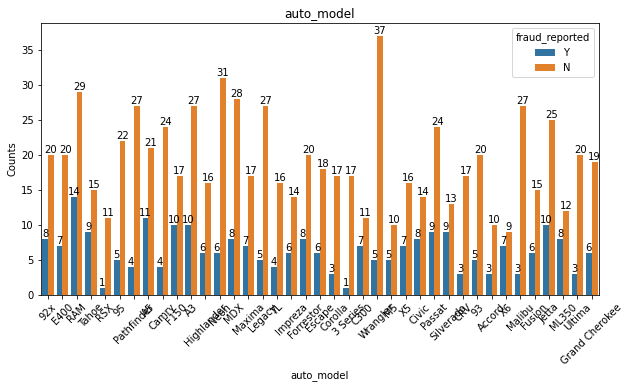

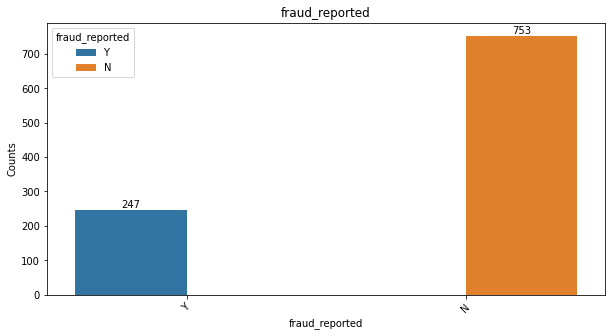

In [65]:
for i in df_object:
    graph = df[i].value_counts()
    plt.figure(figsize = (10,5))
    #plt.subplot(9,2,)
    df_graph = sns.countplot(x= i,hue = 'fraud_reported',  data = df)
    df_graph.set_title(i)
    df_graph.set_xlabel(i)
    df_graph.set_ylabel('Counts')
    plt.xticks(rotation = 45)
    for i in df_graph.containers:
            df_graph.bar_label(i)

### Observations:

In [66]:
for i in df_object:
    print(df.groupby(i)['fraud_reported'].value_counts(),"\n")

policy_state  fraud_reported
IL            N                 261
              Y                  77
IN            N                 231
              Y                  79
OH            N                 261
              Y                  91
Name: fraud_reported, dtype: int64 

policy_csl  fraud_reported
100/300     N                 259
            Y                  90
250/500     N                 259
            Y                  92
500/1000    N                 235
            Y                  65
Name: fraud_reported, dtype: int64 

umbrella_limit  fraud_reported
-1000000        N                   1
 0              N                 611
                Y                 187
 2000000        Y                   2
                N                   1
 3000000        N                  10
                Y                   2
 4000000        N                  26
                Y                  13
 5000000        N                  31
                Y                  15
 

- policy_state  with OH are morely going to fraud as per dataset.


- 250/500 policy_csl are going to fraud as per dataset.


- insured_sex : Female candidates are more fraudster than males as per given dataset.


- insured_education_level : JD education people are more likely to do fraud as per dataset.


- insured_occupation : exec-managerial are going to fraud more.


- insured_hobbies : People with hobby chess are going to fraud more as per dataset.


- insured_relationship: other-relative relationship are fraud more as per dataset.


- incident_type: Single Vehicle Collision are going to fraud more.


- collision_type: Rear Collision are going to fraud more as per dataset.


- incident_severity:  Major Damage severity people going to fraud more as per dataset.


- authorities_contacted:  Most of fraudster contact Other authorities as per dataset.


- incident_state: Most of the fraudster are of SC state.


- incident_city: Arlington city having more chances of fraudster.


- property_damage: No property damage people are going to fraud more as per dataset.


- police_report_available: No police report people having chances to fraud more as per dataset.


- auto_make : Mercedes, Ford  people are morely to report as fraud as per dataset.


- auto_model: RAM having more count of fraud as per dataset.

### Pie Chart

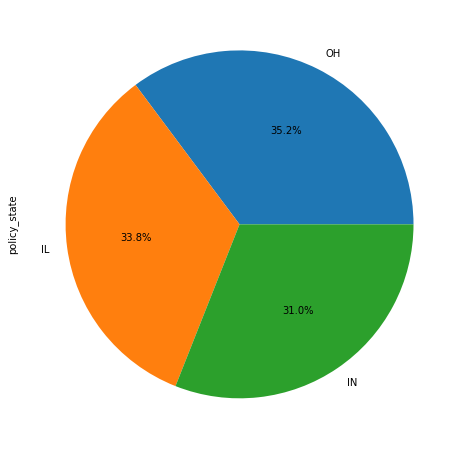

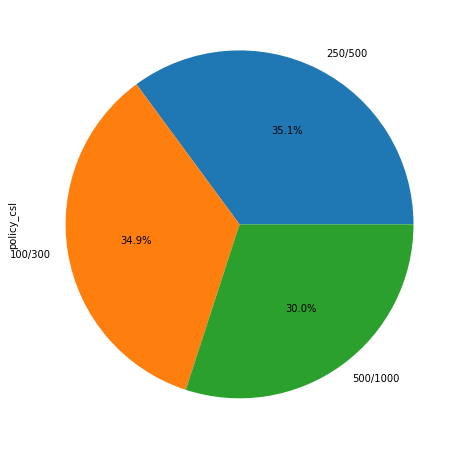

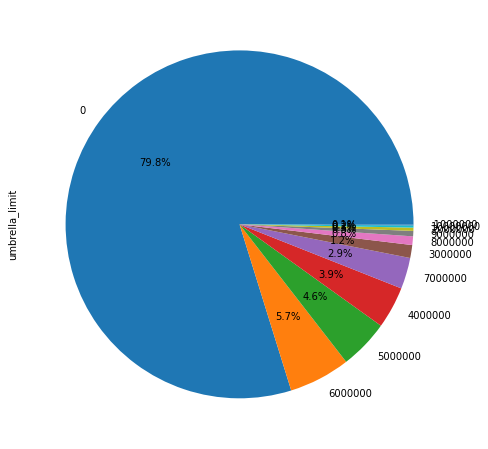

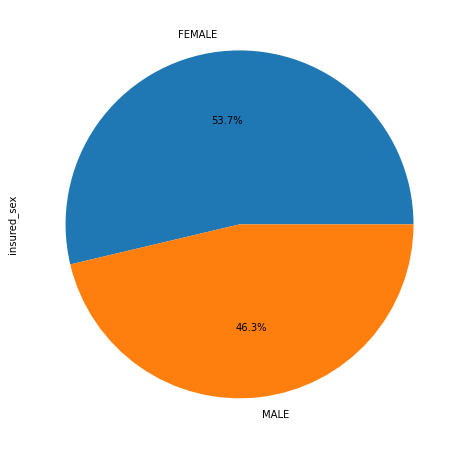

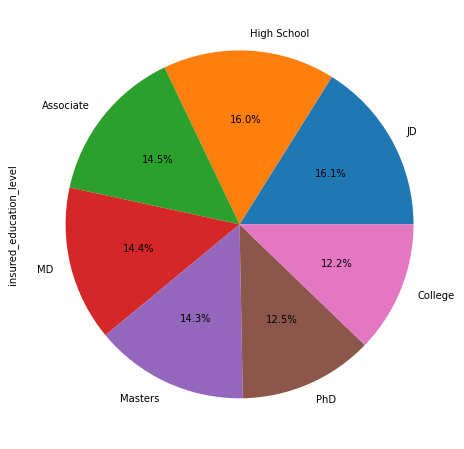

...

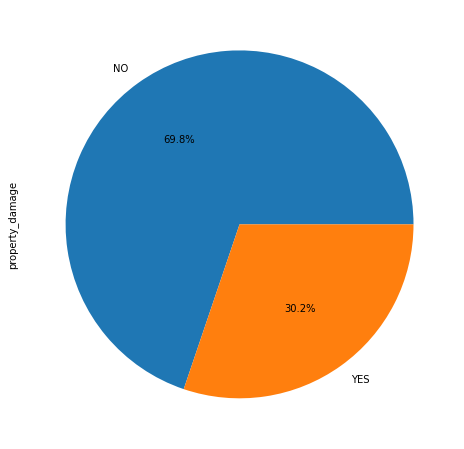

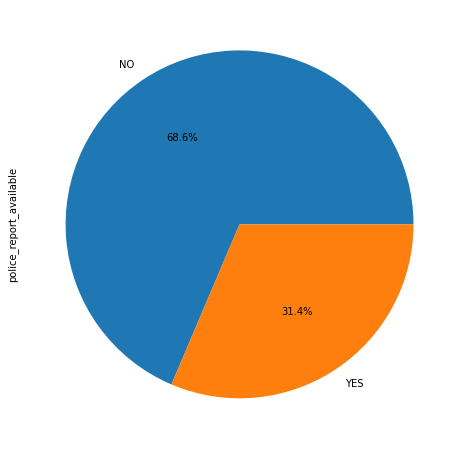

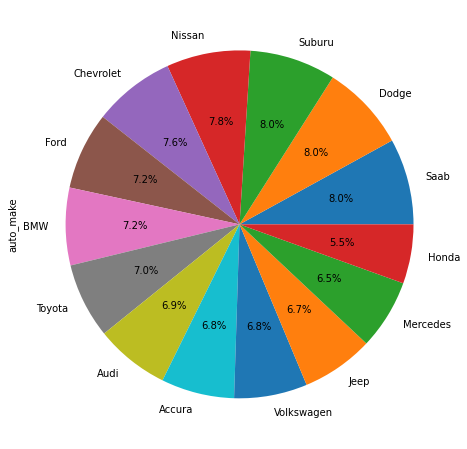

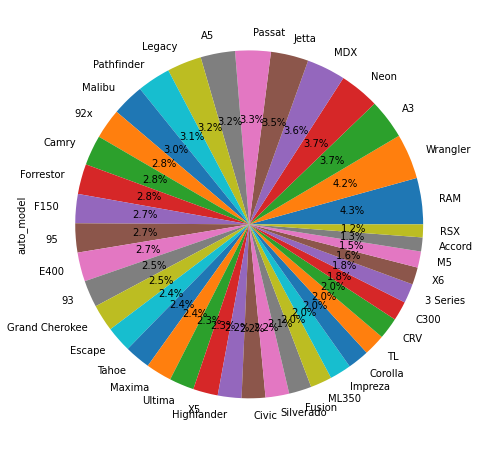

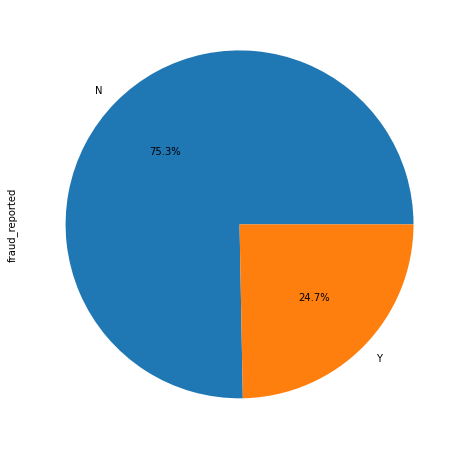

In [67]:
for i in df_object:
    graph = df[i].value_counts()
    plt.figure(figsize = (10,8))
    graph.plot(kind = 'pie', autopct = '%1.1f%%')

### Observations:
    
- policy_state  35.2 percent of the people select OH policy as per dataset.


- policy_csl: 35.1 percent of the people select OH policy as per dataset.

- umbrella limit - Most of the people doesn't having umbrella limit only 20.2 percent ratio of people having umbrella limit.


- insured_sex : Female candidates are more than males as per given dataset.


- insured_education_level : JD education people are more people rather than others as per dataset.


- insured_occupation : 8.5 ratio are of prof-specialty procession people which are higher from among all occupation.


- insured_hobbies : People with hobby reading are more as per dataset.


- insured_relationship: own child relationship are more as per dataset upto 18.3 ratio.


- incident_type: Multi Vehicle Collision are higher in ratio.


- collision_type: Rear Collision are  more as per dataset.


- incident_severity:  Minor Damage severity people are more in auto mobiles.


- authorities_contacted:  Most of people contact police as per dataset.


- incident_state: Most of the people are of SC state as per graph.


- incident_city: Arlington city having more chances of fraudster as most of the people are of Arlington.


- property_damage: No property damage are more as per dataset with ratio 69.8.


- police_report_available: No police report available for 68.6 percent cases as per dataset.


- auto_make : suburu and Dodge are more in auto make per dataset with ratio of 8 percent.


- auto_model: RAM having more count of as per dataset with ratio of 4.2%.

      

#### From above all observations we find that Auto_model does not give any informtion about model building because fraudster doesn't show interest in a specific model.
Hence we can drop it.

In [68]:
df.drop('auto_model', axis = 1, inplace  = True)

### Numerical Columns dataset

### Barplot

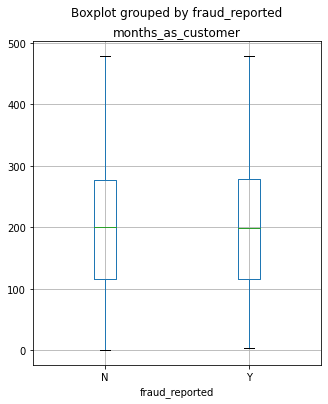

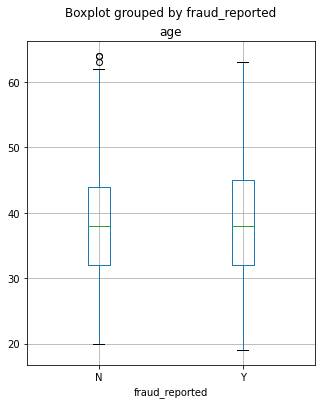

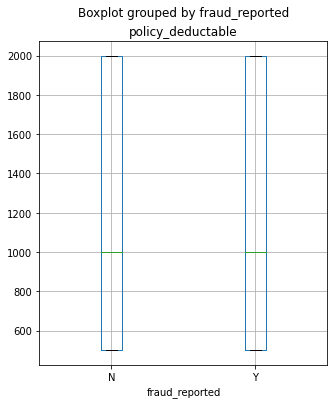

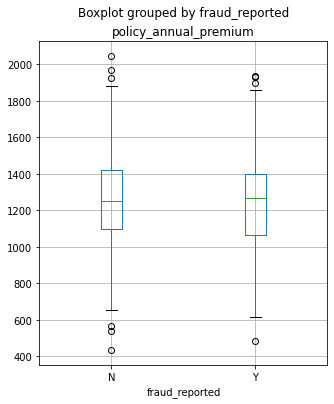

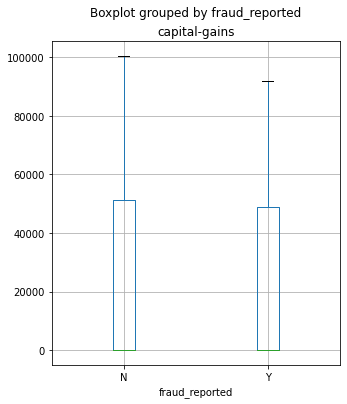

...

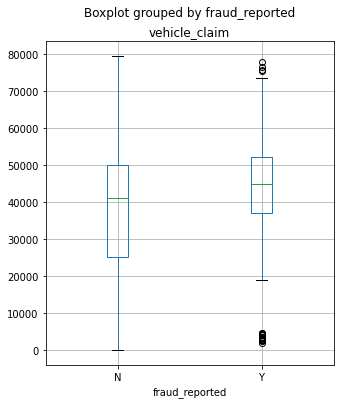

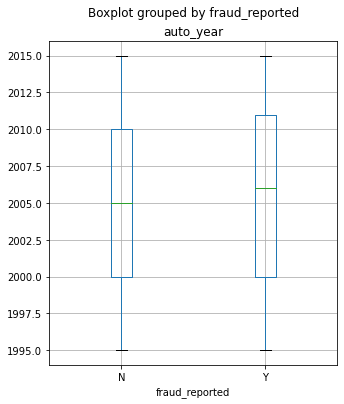

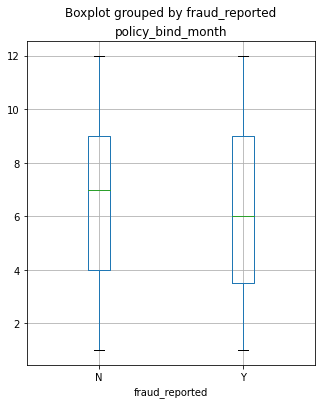

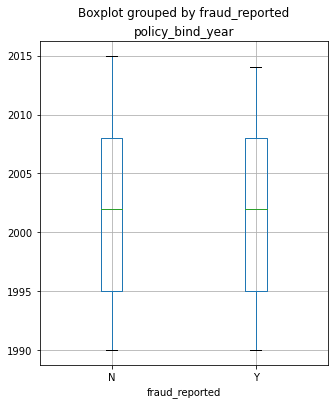

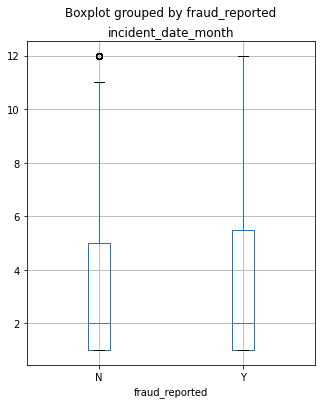

In [69]:
for i in df_num:
    df.boxplot(column = i, by = 'fraud_reported', figsize = (5,6))    

### Observations:
    
- age: age column dataset  having a neglible amount of outliers as per above graph.


- policy_annual_premimum having outliers in both criteria with fraud reported yes and no.


- umrella_limit having too much outliers as per above graph.


- totol _claim_amount having outliers in the dataset of fraud reported as yes.


- property_claim having outliers in both criteria.


- vehicle claim having outliers only in the dataset of y fraud reported.

### Fraud_reported count with respect to incident_data_month

<AxesSubplot:xlabel='incident_date_month', ylabel='count'>

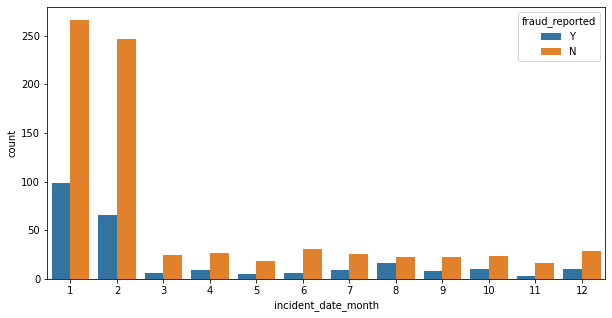

In [70]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'incident_date_month', hue = 'fraud_reported', data = df)

#### Observations: From above graph we find that in the month of January most of the people being reported as fraud.

### Fraud_reported count with respect to incident_hour_of_the_day`4


<AxesSubplot:xlabel='incident_hour_of_the_day', ylabel='count'>

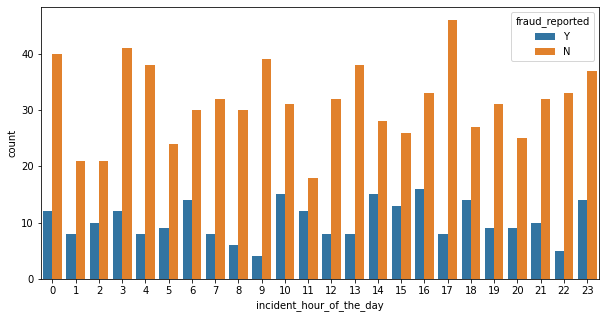

In [71]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'incident_hour_of_the_day', hue = 'fraud_reported', data = df)

#### Observations: There is not a common pattern to say that that on this hour claim peopled are going to do fraud in future.

<AxesSubplot:xlabel='policy_bind_year', ylabel='count'>

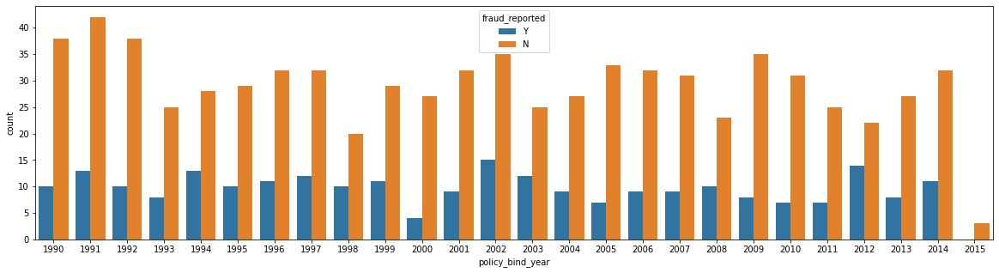

In [72]:
plt.figure(figsize = (20,5))
sns.countplot(x = 'policy_bind_year', hue = 'fraud_reported', data = df)

#### Observations: There is not a common pattern to say that that on this hour claim peopled are going to do fraud in future.

In [73]:
df.keys()

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_year',
       'fraud_reported', 'policy_bind_month', 'policy_bind_year',
       'incident_date_month'],
      dtype='object')

### Policy_bind_month counts 

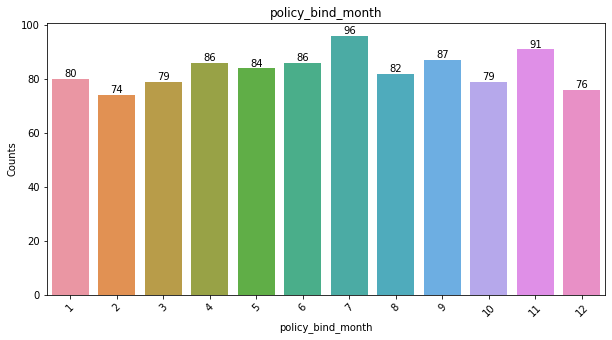

In [74]:
plt.figure(figsize = (10,5))
pbm = sns.countplot(x= 'policy_bind_month', data = df)
pbm.set_title('policy_bind_month')
pbm.set_xlabel('policy_bind_month')
pbm.set_ylabel('Counts')
plt.xticks(rotation = 45)
for i in pbm.containers:
    pbm.bar_label(i)

#### Observations: On 7 month of year maximum people bind with a policy as per graph and very low in F4ebruary.

### Categorical Plot

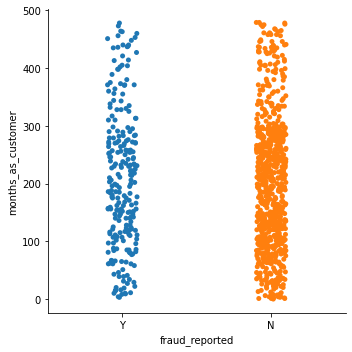

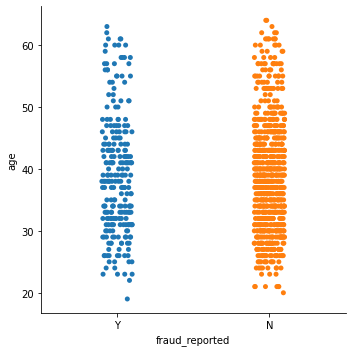

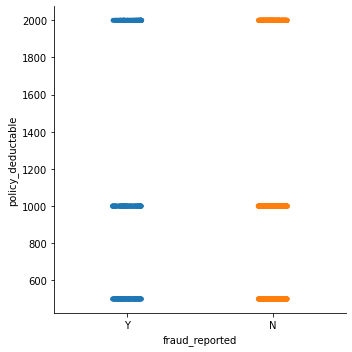

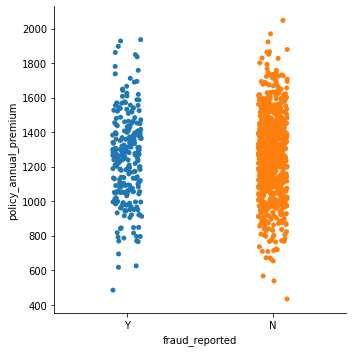

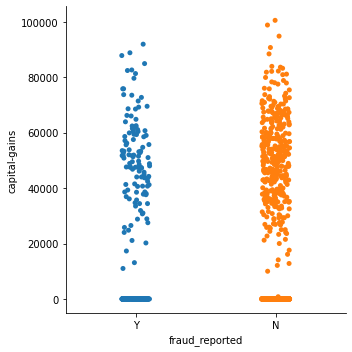

...

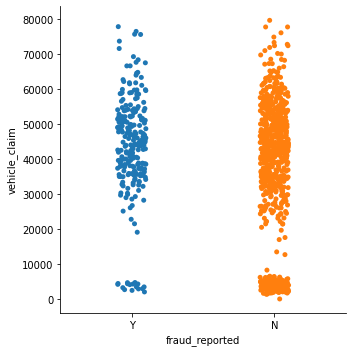

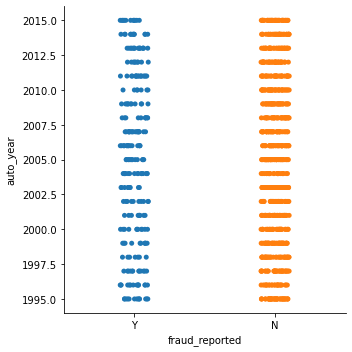

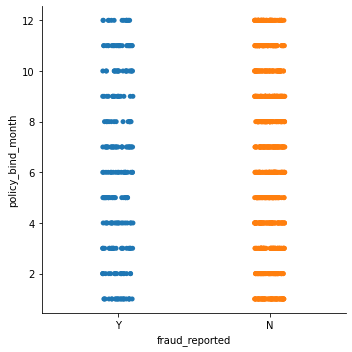

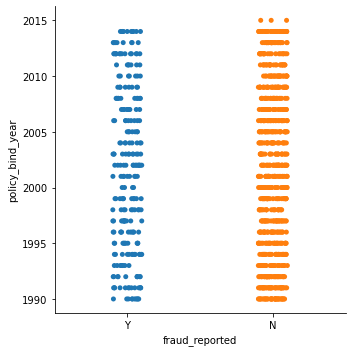

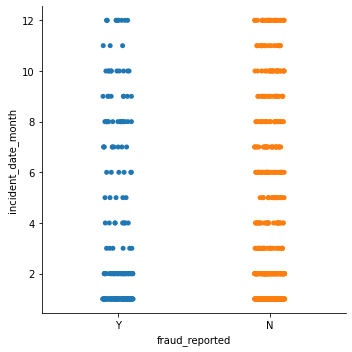

In [75]:
for i in df_num:
    sns.catplot(x = 'fraud_reported', y = i, data = df)    
    

#### Observations:  As per above graphs, we find that most of the dataset having fraud_report N in higher amounts.

### Bivariate Analysis of Numerical dataset

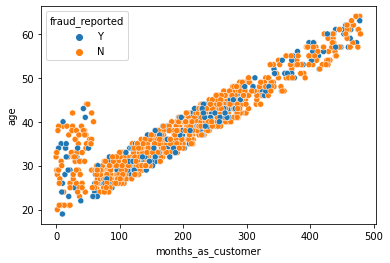

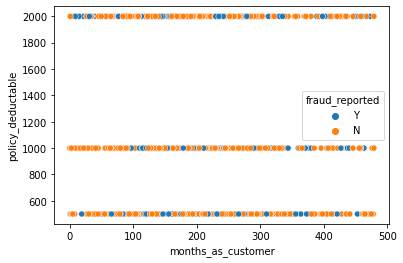

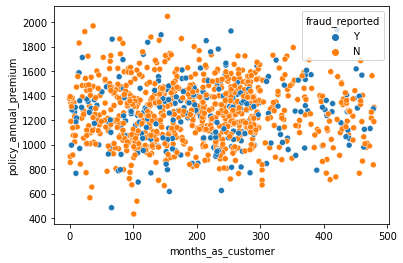

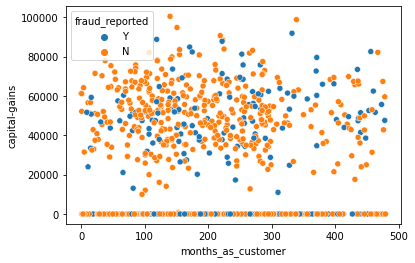

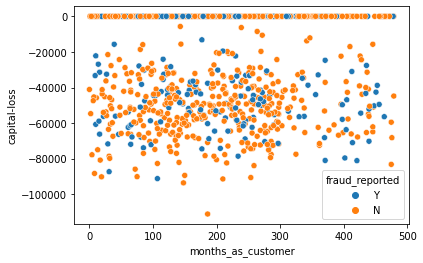

...

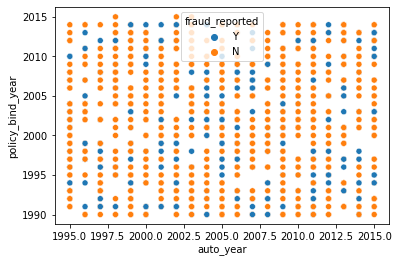

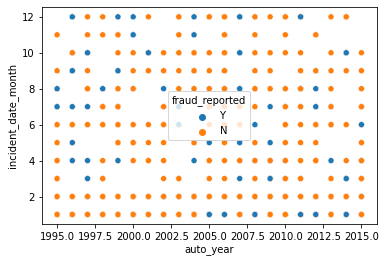

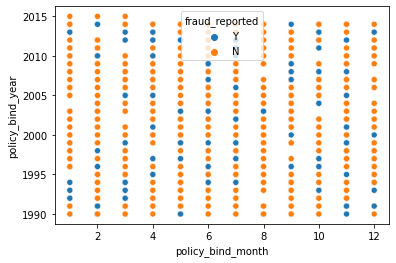

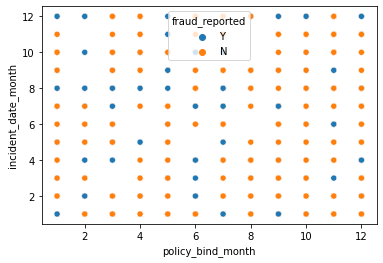

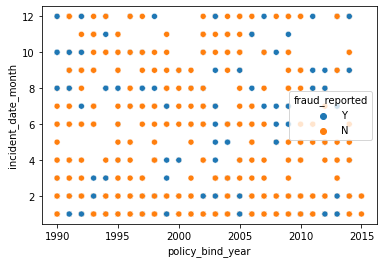

In [276]:
for i in range(len(df_num)):
    for j in df_num[i+1:]:
        plt.figure()
        sns.scatterplot(df[df_num[i]], df[j], hue = df['fraud_reported'])

### Observations: 


- Inquiry_claim with total_claim_amount show linear increment accordingly.


- Similarily property_claim and vehicle claim shows also linear increment ac- cording.


- Vehicle_claim and property_claim shows linearly increament with respect to each other.


- Age and month as customer are directly proportional to each others.


- Rest graphs not shows liable details.

### Violin Plot

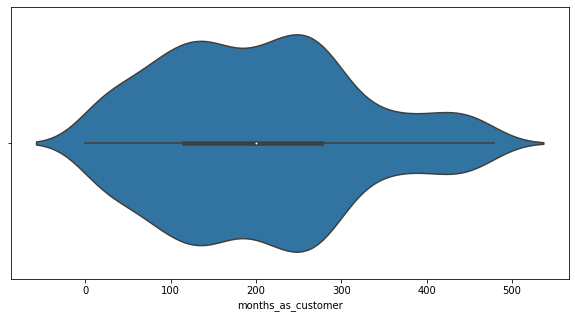

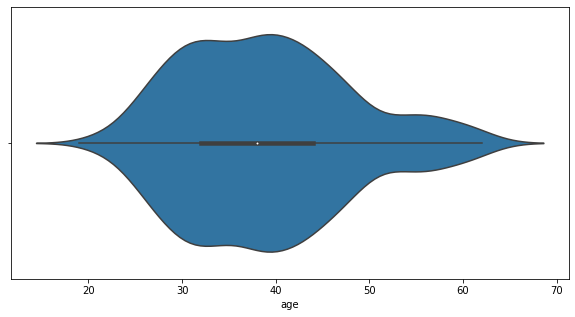

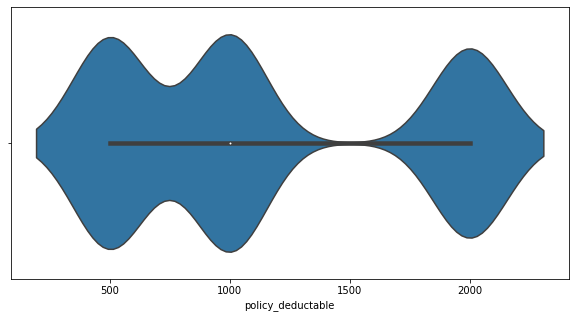

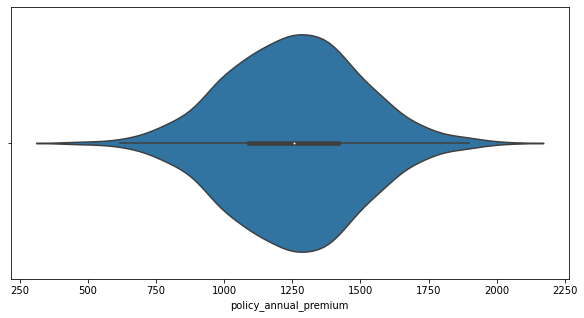

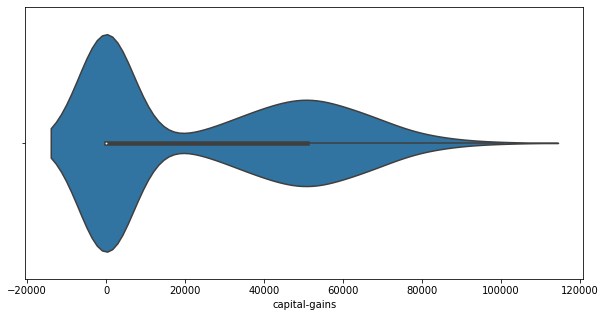

...

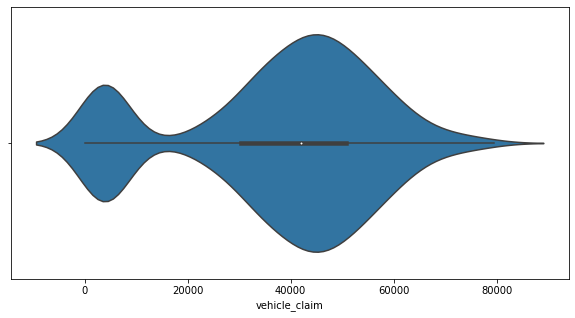

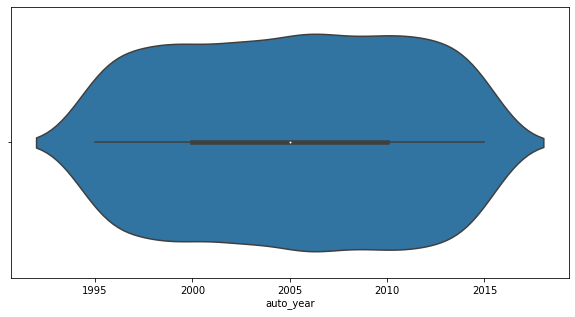

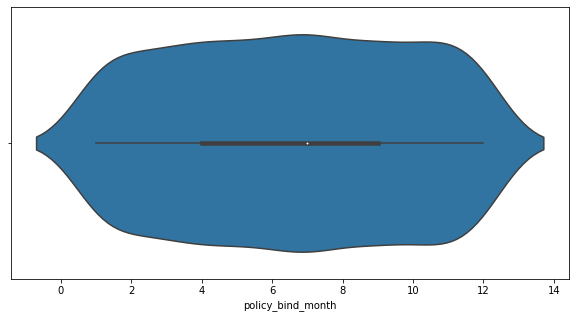

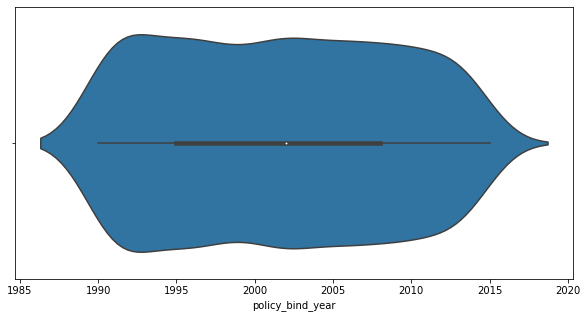

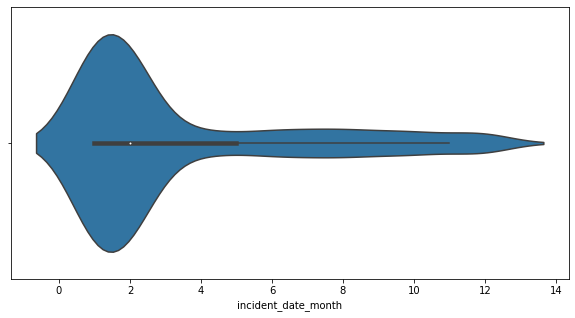

In [76]:
for i in df_num:
    plt.figure(figsize = (10,5))
    sns.violinplot(df[i] , data = df)
    
    
# checking spreading density of the data

### Observations:

- month_as_customer: having density in the range of 0 to 500 but most of the customer lies in the range of 0 to 300 approx as per graph.


- Age: having density in the range of 20 to 70 but most of the customer lies in the range of 20 to 55 approx as per graph.


- policy_deductable: are divided into 3 parts of density with different different range as per above graph.


- policy_annual_premium: its density range lies between 250 to 2000 approx.


- capital-gains: As per graph most of the people didn't get any gains but a few people gains with the range of 20000 to 100000 approx.


- capital-loss: As per graph most of the people didn't get any loss but a few people loss with the range of -20000 to 600000 approx.


- incident_hour_of the day shows common density pattern.


- numbers of vehicle involved: it is divided into two parts which are 1 and 3 as per graph.

- bodily_injuries : it is divided into three parts which are 0 to 2 approx as per graph.


- witness : it is divided into four parts which are 0 to 3 approx as per graph.


- total_claim_amount: most of the people claim amount lies in the density ranges of 20000 to 1000000 as per graph.


- injury_claim: most of the people claim amount lies in the density ranges of 0 to 20000 as per graph.


- property_claim: most of the people claim amount lies in the density ranges of 0 to 20000 as per graph.


- vehicle_claim: most of the claim amount lies in the range of 20000 to 80000.


- auto_year, policy_bind_month and policy_bind_year show normal density ranges as per graph.


- incident date month: most of the incident lies in January to February as per density curve.

#### 

### Checking Distribution of the Dataset

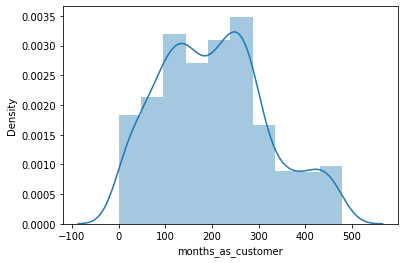

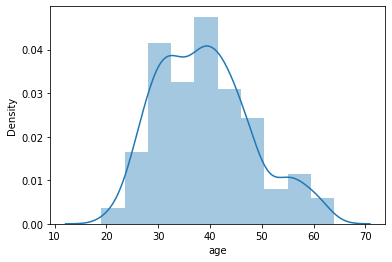

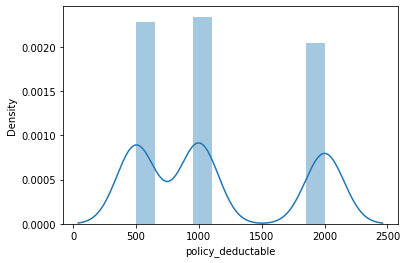

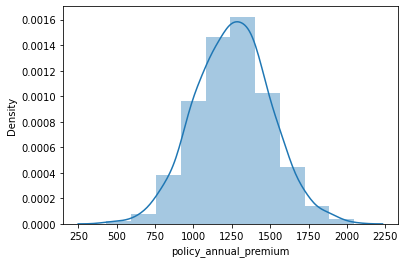

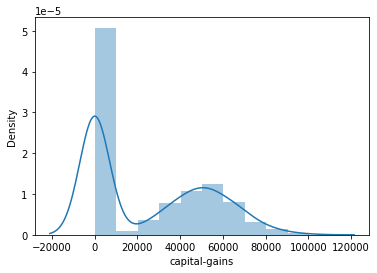

...

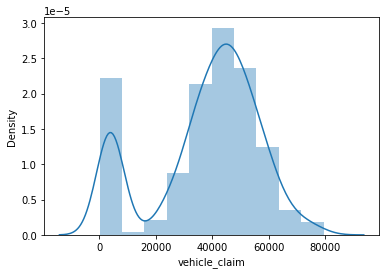

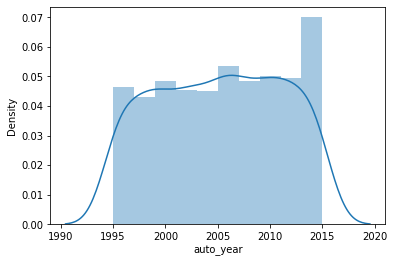

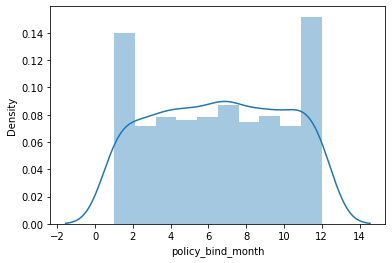

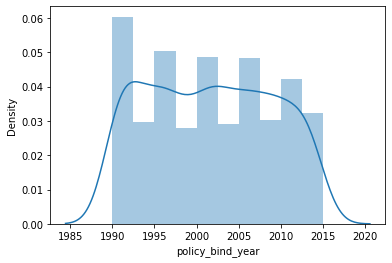

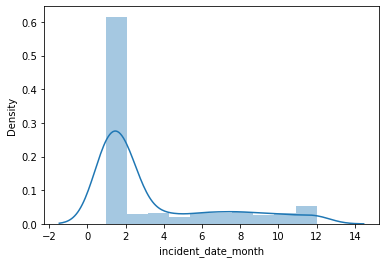

In [77]:
for i in df_num:
    plt.figure()
    sns.distplot(df[i], bins = 10)

#### Observations: Distribution plot behave same as density plot with bins

### Checking Outliers

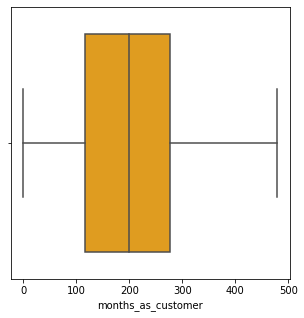

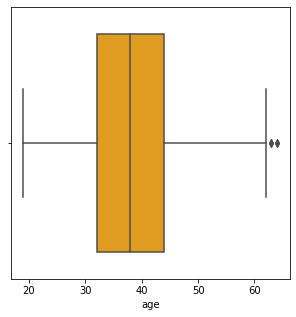

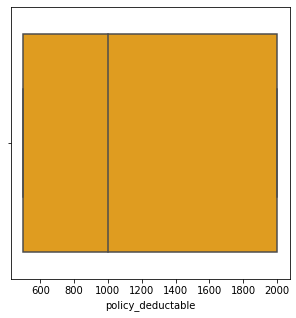

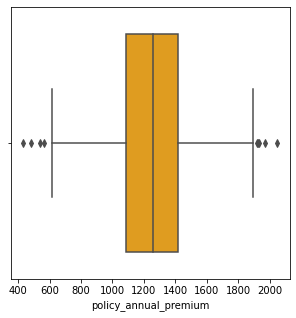

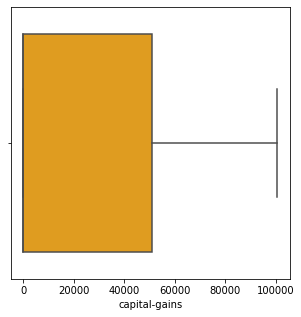

...

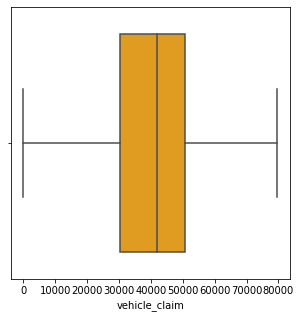

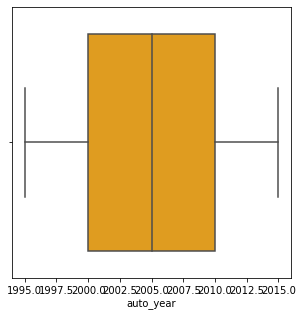

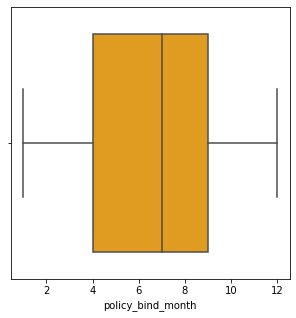

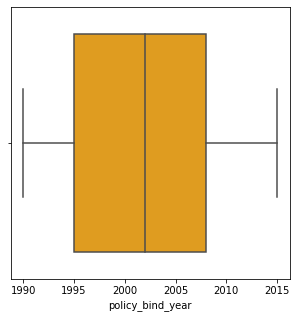

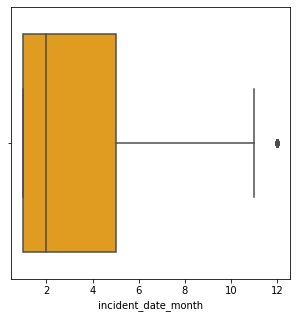

In [78]:
for i in df_num:
    plt.figure(figsize = (5,5))
    sns.boxplot(df[i], orient='v', color='orange')

### Observations:
    
- age: age column dataset  having a neglible amount of outliers as per above graph.


- policy_annual_premimum having outliers in both criteria with fraud reported yes and no.



- totol _claim_amount having outliers in the dataset of fraud reported.


- property_claim having outliers in both criteria.


- incident_date_month having outliers only in the dataset of a single month.

## Checking Skewness

In [79]:
df[df_num].skew()

months_as_customer             0.362177
age                            0.478988
policy_deductable              0.477887
policy_annual_premium          0.004402
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
policy_bind_month             -0.029321
policy_bind_year               0.052511
incident_date_month            1.375894
dtype: float64

<Figure size 72x36 with 0 Axes>

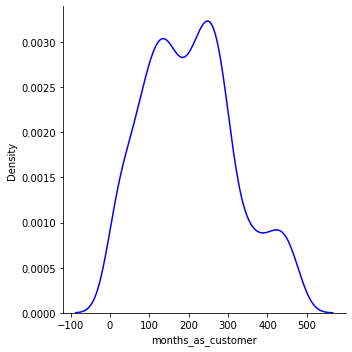

<Figure size 72x36 with 0 Axes>

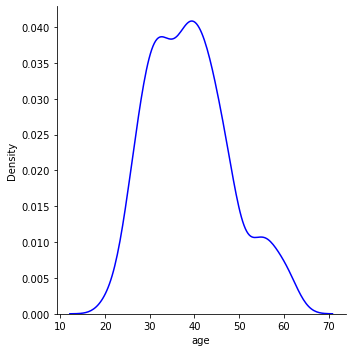

<Figure size 72x36 with 0 Axes>

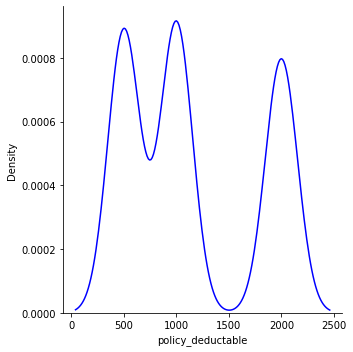

<Figure size 72x36 with 0 Axes>

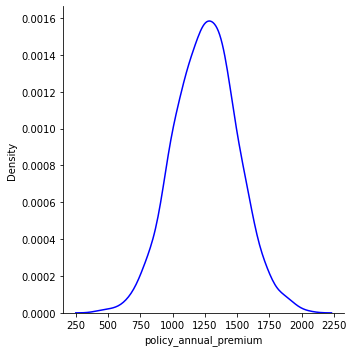

<Figure size 72x36 with 0 Axes>

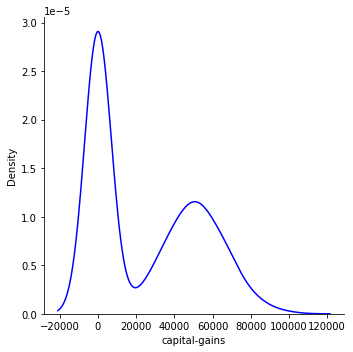

<Figure size 72x36 with 0 Axes>

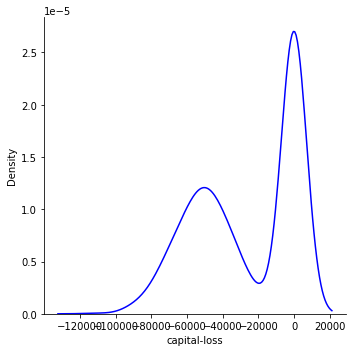

<Figure size 72x36 with 0 Axes>

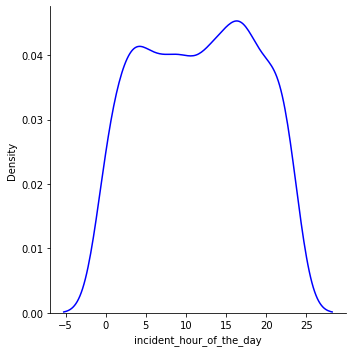

<Figure size 72x36 with 0 Axes>

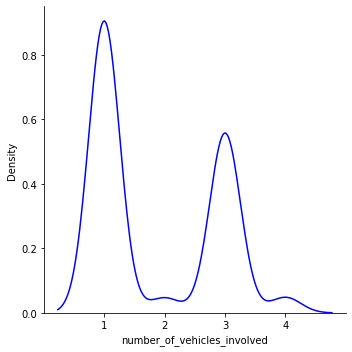

<Figure size 72x36 with 0 Axes>

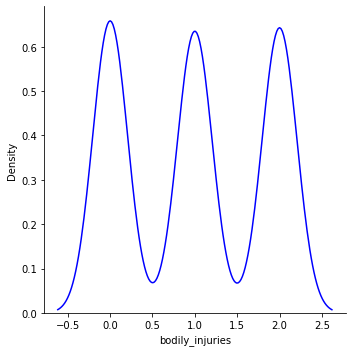

<Figure size 72x36 with 0 Axes>

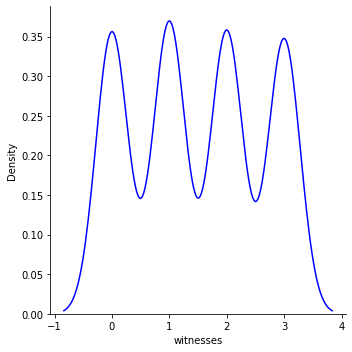

<Figure size 72x36 with 0 Axes>

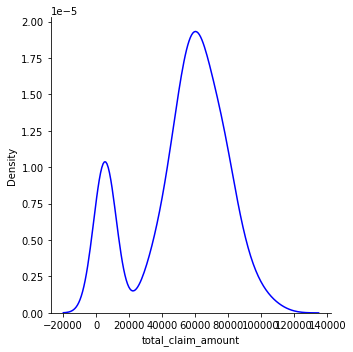

<Figure size 72x36 with 0 Axes>

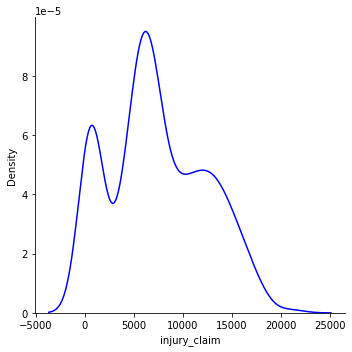

<Figure size 72x36 with 0 Axes>

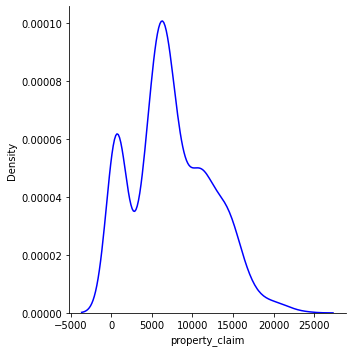

<Figure size 72x36 with 0 Axes>

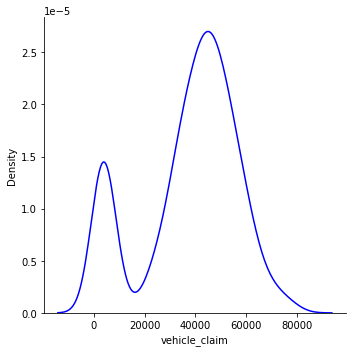

<Figure size 72x36 with 0 Axes>

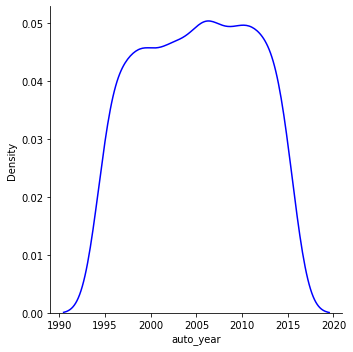

<Figure size 72x36 with 0 Axes>

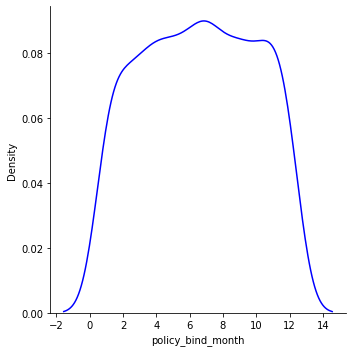

<Figure size 72x36 with 0 Axes>

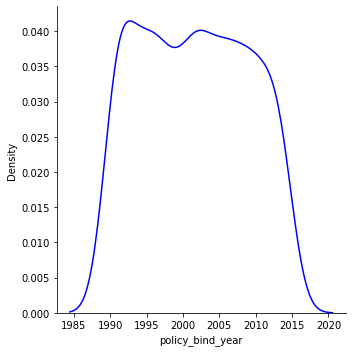

<Figure size 72x36 with 0 Axes>

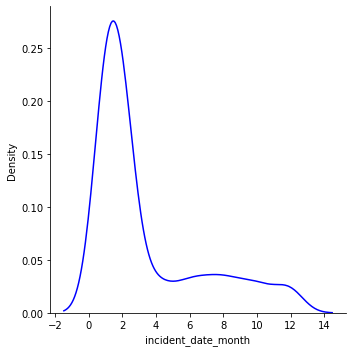

In [80]:
for i in df_num:
    plt.figure(figsize = (1,0.5))
    sns.displot(df[i], kind = 'kde', color = 'blue',)

### Observations: 
Month as customer, age, policy_deductable, capital gains , number of vehicle involved, injury claim, property claim and incident date month shows right skewness towards the dataset rest of incident hour of the day,capital loss, total claim amount vehicle claim, auto year, policy bind month show left skewness towards the dataset.

## Checking Overall of the Dataset by Pairplot

<Figure size 1080x1080 with 0 Axes>

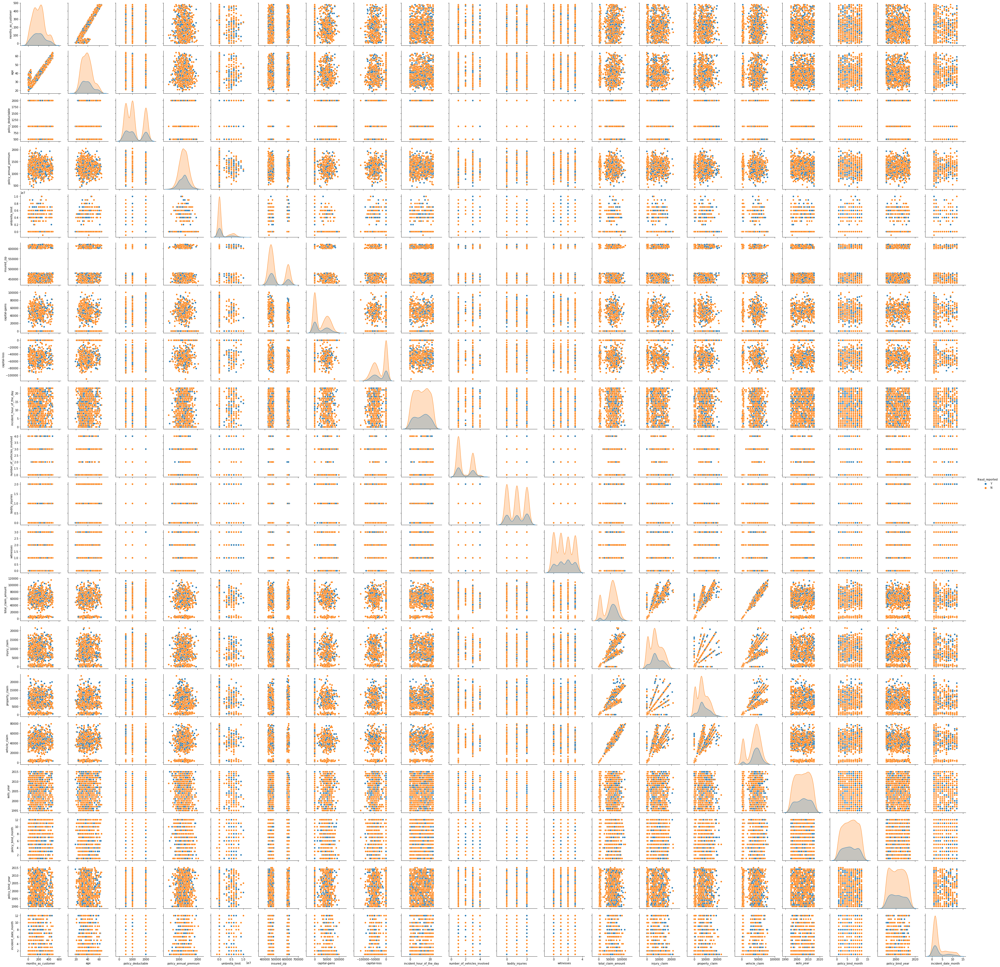

In [77]:
plt.figure(figsize = (15,15))
sns.pairplot(df, hue = 'fraud_reported')

#### Observations: Measured all analysis above are similar to pairplot.

### Label Encoder for target variable

In [81]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [82]:
df['fraud_reported'] = le.fit_transform(df['fraud_reported'])
df.head(2)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,1,10,2014,1
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,2007,1,6,2006,1


### For making similar predictor variable we are using Ordinal Encoder

In [83]:
from sklearn.preprocessing import OrdinalEncoder
onc = OrdinalEncoder()

In [84]:
for i in df.select_dtypes(include = 'object').columns:
    df[i] = onc.fit_transform(df[i].values.reshape(-1,1))

df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
0,328,48,2.0,1.0,1000,1406.91,1.0,1.0,4.0,2.0,17.0,0.0,53300,0,2.0,2.0,0.0,4.0,4.0,1.0,5,1,1.0,1,2,1.0,71610,6510,13020,52080,10.0,2004,1,10,2014,1
1,228,42,1.0,1.0,2000,1197.22,5.0,1.0,4.0,6.0,15.0,2.0,0,0,3.0,1.0,1.0,4.0,5.0,5.0,8,1,0.0,0,0,0.0,5070,780,780,3510,8.0,2007,1,6,2006,1
2,134,29,2.0,0.0,2000,1413.14,5.0,0.0,6.0,11.0,2.0,3.0,35100,0,0.0,1.0,1.0,4.0,1.0,1.0,7,3,0.0,2,3,0.0,34650,7700,3850,23100,4.0,2007,0,6,2000,2
3,256,41,0.0,1.0,2000,1415.74,6.0,0.0,6.0,1.0,2.0,4.0,48900,-62400,2.0,0.0,0.0,4.0,2.0,0.0,5,1,0.0,1,2,0.0,63400,6340,6340,50720,3.0,2014,1,5,1990,10
4,228,44,0.0,2.0,1000,1583.91,6.0,1.0,0.0,11.0,2.0,4.0,66000,-46000,3.0,1.0,1.0,2.0,1.0,0.0,20,1,0.0,0,1,0.0,6500,1300,650,4550,0.0,2009,0,6,2014,2


## Removing Outliers from the Dataset

#### Z score method

In [85]:
from scipy.stats import zscore

z = np.abs(zscore(df))

# taking thresold value = 3
#np.where(z>3)

df_z = df[(z<3).all(axis = 1)]

In [86]:
np.where(z>3)  

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 28,  6,  6,  6,  5, 13,
         6,  6,  6], dtype=int64))

In [87]:
print(df_z.shape)
print(df.shape)

(980, 36)
(1000, 36)


In [88]:
percentage = round((1000-980)/1000*100,2)
print(percentage, "Percentage of data loss")  

2.0 Percentage of data loss


### Removing Outliers with Interquartile Method

In [89]:
Q1 = df.quantile(.25)
Q3 = df.quantile(.75)
IQR = Q3 - Q1

In [90]:
df_IQR = df[~((df<(Q1 - 1.5*IQR)) | (df>(Q3 + 1.5*IQR))).any(axis = 1)]

In [91]:
print(df_IQR.shape)
print(df.shape)

(578, 36)
(1000, 36)


In [92]:
percentage = round((1000-578)/1000*100,2)
print(percentage, "Percentage of data loss")  

42.2 Percentage of data loss


### From above two methods of removing outliers we find that Zscore give lesser data loss with respect to interquartile method hence we are selecting Zscore method for removing outliers.

In [93]:
df_z.describe()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
count,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000
mean,204.613265,38.973469,1.020408,0.945918,1137.244898,1257.206510,1.802041,0.465306,2.959184,6.643878,9.743878,2.417347,25287.959184,-26692.448980,1.177551,1.021429,1.183673,2.163265,3.242857,2.982653,11.688776,1.834694,0.304082,0.997959,1.481633,0.315306,52693.010204,7426.244898,7386.173469,37880.591837,6.569388,2005.133673,0.244898,6.553061,2001.565306,3.394898
std,115.420174,9.184040,0.830713,0.804821,611.258486,241.568379,1.743980,0.499050,1.954113,4.018943,5.692738,1.682787,27918.880339,27951.834834,1.080568,0.727786,0.939943,1.533380,2.157771,2.037119,6.966436,1.018331,0.460252,0.817328,1.112043,0.464875,26341.641716,4885.829062,4793.054917,18846.130656,4.028788,6.014240,0.430246,3.402853,7.391491,3.267160
min,0.000000,19.000000,0.000000,0.000000,500.000000,538.170000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-93600.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,0.000000,1995.000000,0.000000,1.000000,1990.000000,1.000000
25%,116.000000,32.000000,0.000000,0.000000,500.000000,1087.875000,1.000000,0.000000,1.000000,3.000000,5.000000,1.000000,0.000000,-51325.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,41697.500000,4277.500000,4480.000000,30220.000000,3.000000,2000.000000,0.000000,4.000000,1995.000000,1.000000
50%,200.000000,38.000000,1.000000,1.000000,1000.000000,1257.200000,1.000000,0.000000,3.000000,7.000000,10.000000,2.000000,0.000000,-23250.000000,1.500000,1.000000,1.000000,2.000000,4.000000,3.000000,12.000000,1.000000,0.000000,1.000000,1.000000,0.000000,57880.000000,6760.000000,6745.000000,42080.000000,7.000000,2005.000000,0.000000,7.000000,2002.000000,2.000000
75%,278.000000,44.250000,2.000000,2.000000,2000.000000,1415.825000,1.000000,1.000000,5.000000,10.000000,15.000000,4.000000,51100.000000,0.000000,2.000000,2.000000,2.000000,4.000000,5.000000,5.000000,17.250000,3.000000,1.000000,2.000000,2.000000,1.000000,70425.000000,11235.000000,10860.000000,50727.500000,10.000000,2010.000000,0.000000,9.000000,2008.000000,5.000000
max,479.000000,64.000000,2.000000,2.000000,2000.000000,1969.630000,7.000000,1.000000,6.000000,13.000000,19.000000,5.000000,100500.000000,0.000000,3.000000,2.000000,3.000000,4.000000,6.000000,6.000000,23.000000,4.000000,1.000000,2.000000,3.000000,1.000000,114920.000000,21450.000000,21810.000000,79560.000000,13.000000,2015.000000,1.000000,12.000000,2015.000000,12.000000


<AxesSubplot:>

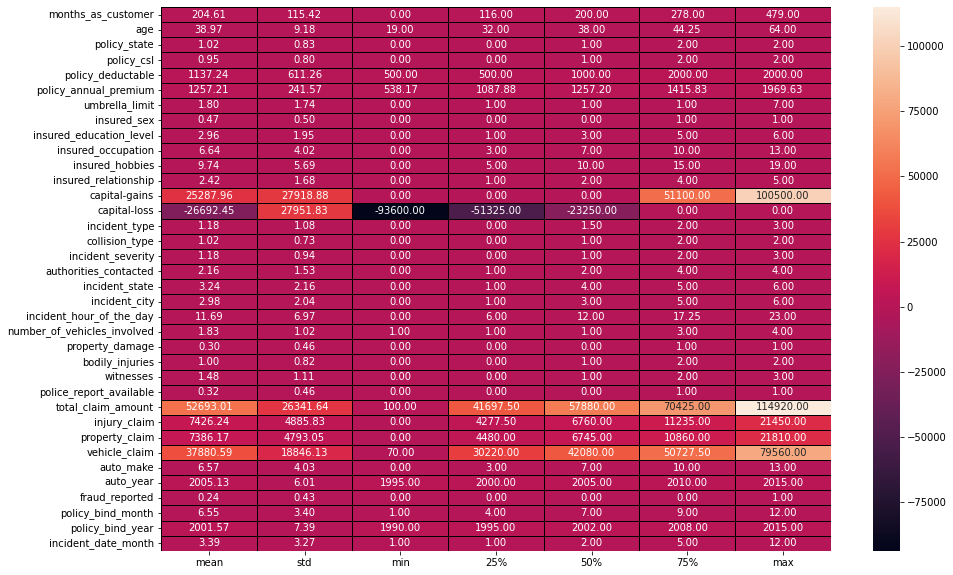

In [94]:
plt.figure(figsize = (15,10))
sns.heatmap(df_z.describe()[1:].transpose(), annot = True, linecolor='black', linewidths=0.5, fmt = '.2f')

#checking description visually

#### From above code we find that total claim amount , vehicle claim, capital gains values are much higher than its dataset value from this we conclude that this column dataset probably having outliers.

### Checking Correlation of the Dataset

In [95]:
df_z.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
months_as_customer,1.000000,0.922960,-0.007183,-0.021855,0.031041,-0.003814,0.021227,0.059644,-0.000731,0.006925,-0.089358,0.071492,0.007468,0.023041,-0.016746,-0.073031,-0.064094,0.013782,0.015811,-0.006601,0.066198,0.011831,-0.000630,-0.007674,0.063574,-0.017200,0.058761,0.065062,0.036660,0.055941,0.049734,0.000869,0.021285,0.004207,-0.041914,0.019242
age,0.922960,1.000000,-0.020012,-0.013323,0.032036,0.005330,0.017210,0.073790,0.001647,0.014798,-0.079099,0.076129,-0.004529,0.012860,-0.026286,-0.076325,-0.064396,0.018441,0.012644,-0.006685,0.083720,0.020391,-0.008239,-0.012254,0.056360,-0.018135,0.067812,0.077149,0.062375,0.058918,0.033757,0.005594,0.013279,0.014492,-0.031709,0.018221
policy_state,-0.007183,-0.020012,1.000000,0.001653,0.017612,0.015089,-0.012015,-0.018002,-0.027173,-0.025357,-0.039501,-0.017060,0.068619,-0.031926,0.032373,0.049961,-0.028353,-0.014647,0.019456,-0.002809,0.021926,-0.045514,-0.013576,0.012097,0.025838,0.065316,-0.014693,-0.048188,-0.006420,-0.006411,0.010259,-0.001160,0.034587,0.073692,-0.003045,0.027889
policy_csl,-0.021855,-0.013323,0.001653,1.000000,0.009912,0.032654,0.014197,-0.003405,0.008337,0.016461,-0.003695,-0.034603,0.009786,-0.035589,0.005180,0.028139,0.017195,0.051030,0.035804,0.014380,0.003918,-0.014658,-0.024497,0.001385,0.071361,-0.008979,-0.054128,-0.080098,-0.042876,-0.043987,-0.009395,-0.030370,-0.032509,-0.041283,-0.019409,-0.010904
policy_deductable,0.031041,0.032036,0.017612,0.009912,1.000000,-0.008300,0.016409,-0.006977,0.014101,-0.053888,-0.001923,-0.019000,0.031673,-0.019601,-0.032291,-0.055984,-0.016363,0.002769,0.000647,-0.047304,0.064732,0.046331,0.013074,-0.037263,0.071709,0.036275,0.023835,0.038459,0.071031,0.005279,-0.028032,0.030569,0.015774,-0.054208,-0.054041,-0.010288
policy_annual_premium,-0.003814,0.005330,0.015089,0.032654,-0.008300,1.000000,-0.015823,0.041312,-0.021400,0.027827,-0.014226,0.004417,-0.006807,0.033133,0.051606,0.032604,-0.013911,-0.054425,0.048647,0.047771,-0.006448,-0.044544,0.076447,0.027837,0.003433,0.032413,-0.000223,-0.024119,-0.014073,0.009521,0.009311,-0.042446,-0.012686,-0.031608,0.002433,0.009544
umbrella_limit,0.021227,0.017210,-0.012015,0.014197,0.016409,-0.015823,1.000000,0.017921,-0.032346,0.003048,-0.034949,0.093614,-0.021068,-0.027222,0.034389,0.006565,-0.000229,0.022411,-0.083029,0.043022,-0.023825,-0.041451,-0.082727,0.043429,-0.000297,-0.033804,-0.049054,-0.047037,-0.022975,-0.050526,0.011552,0.030475,0.042895,-0.000466,0.046171,0.027538
insured_sex,0.059644,0.073790,-0.018002,-0.003405,-0.006977,0.041312,0.017921,1.000000,0.010068,-0.007440,-0.020928,0.004488,-0.019824,-0.030319,0.009540,-0.019044,-0.021242,0.019423,-0.022522,0.009957,0.012904,0.018852,0.032636,-0.015199,0.039343,0.014179,-0.016275,0.008472,-0.008744,-0.022720,0.019996,-0.033336,0.020582,-0.003125,-0.031230,0.036916
insured_education_level,-0.000731,0.001647,-0.027173,0.008337,0.014101,-0.021400,-0.032346,0.010068,1.000000,-0.025394,0.025229,-0.028673,0.044276,0.037070,0.005854,-0.022368,-0.010929,-0.015500,-0.007821,-0.022502,-0.053983,0.003279,-0.050922,-0.017959,0.021747,0.055785,0.079458,0.086600,0.062230,0.072782,0.060043,0.054438,0.013116,-0.011963,0.016874,0.069564
insured_occupation,0.006925,0.014798,-0.025357,0.016461,-0.053888,0.027827,0.003048,-0.007440,-0.025394,1.000000,-0.010375,-0.012135,0.000409,-0.016182,0.003755,0.012390,-0.000513,-0.000998,-0.020759,0.003112,-0

<AxesSubplot:>

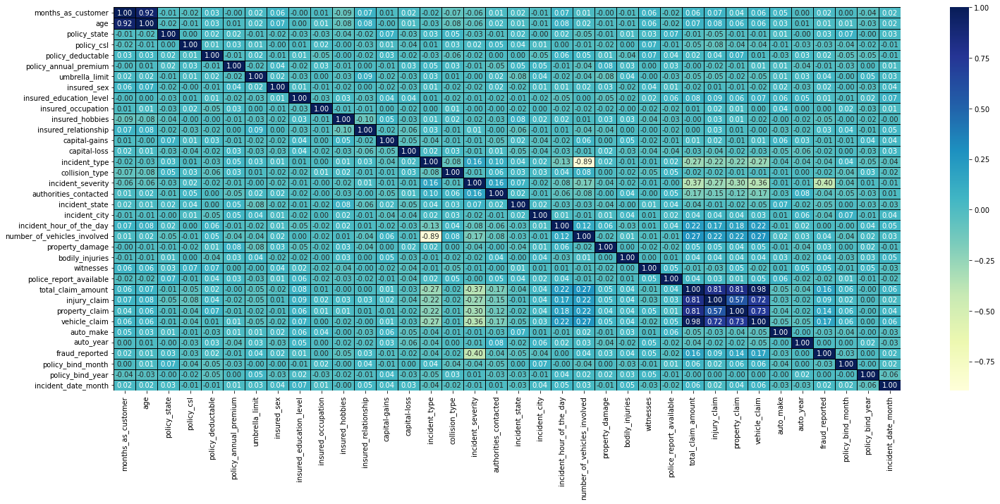

In [96]:
plt.figure(figsize = (25,10))
sns.heatmap(df_z.corr(), annot = True, linecolor = 'black', linewidths = 1, fmt = '.2f', cmap="YlGnBu" )

#### Observations: total claim amount, injury claim, property claim and vehicle claim shows very high correlation with each other as per graph.

## Checking Positive and Negative Correlation

<AxesSubplot:>

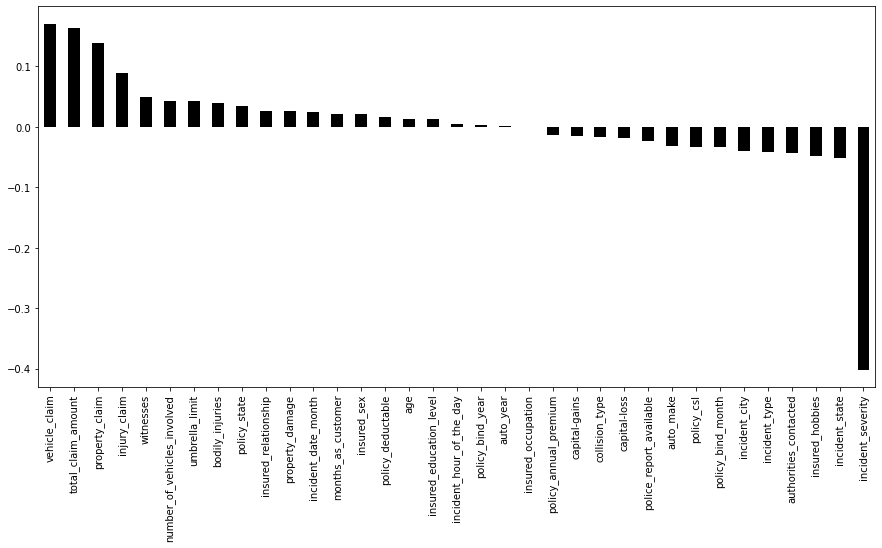

In [97]:
plt.figure(figsize = (15,7))
df_z.corr()['fraud_reported'].sort_values(ascending = False).drop('fraud_reported').plot(kind = 'bar', color = 'k')

#### Observations:
'vehicle_claim', 'total_claim_amount','property_claim', 'injury_claim', 'witnesses', 'umbrella_limit', 'number_of_vehicles_involved', 'bodily_injuries', 'policy_state', 'insured_relationship', 'property_damage', 'incident_date_month','months_as_customer', 'insured_sex', 'policy_deductable', 'age', 'insured_education_level', 'incident_hour_of_the_day', 'policy_bind_year', 'auto_year' **shows positive correlation with respect to fraud reported** while rest of dataset shows **negative correlation.**

## Dividing data for feature selection

In [98]:
x = df_z.drop('fraud_reported', axis = 1)
y = df_z['fraud_reported']

In [99]:
print('shape of x', x.shape)
print('Shape of y', y.shape)

shape of x (980, 35)
Shape of y (980,)


### Using Get Dummies Method to prevent overfitting of Model as Model having so many columns with Multiple Unique Values
    

In [100]:
x = pd.get_dummies(data = x, columns = ['policy_state', 'policy_csl', 'umbrella_limit', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'property_damage', 'police_report_available',
       'auto_make'])

In [101]:
x.shape

(980, 129)

In [102]:
x.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_month,policy_bind_year,incident_date_month,policy_state_0.0,policy_state_1.0,policy_state_2.0,policy_csl_0.0,policy_csl_1.0,policy_csl_2.0,umbrella_limit_0.0,umbrella_limit_1.0,umbrella_limit_2.0,umbrella_limit_3.0,umbrella_limit_4.0,umbrella_limit_5.0,umbrella_limit_6.0,umbrella_limit_7.0,insured_sex_0.0,insured_sex_1.0,insured_education_level_0.0,insured_education_level_1.0,insured_education_level_2.0,insured_education_level_3.0,insured_education_level_4.0,insured_education_level_5.0,insured_education_level_6.0,insured_occupation_0.0,insured_occupation_1.0,insured_occupation_2.0,insured_occupation_3.0,insured_occupation_4.0,insured_occupation_5.0,insured_occupation_6.0,insured_occupation_7.0,insured_occupation_8.0,insured_occupation_9.0,insured_occupation_10.0,insured_occupation_11.0,insured_occupation_12.0,insured_occupation_13.0,insured_hobbies_0.0,insured_hobbies_1.0,insured_hobbies_2.0,insured_hobbies_3.0,insured_hobbies_4.0,insured_hobbies_5.0,insured_hobbies_6.0,insured_hobbies_7.0,insured_hobbies_8.0,insured_hobbies_9.0,insured_hobbies_10.0,insured_hobbies_11.0,insured_hobbies_12.0,insured_hobbies_13.0,insured_hobbies_14.0,insured_hobbies_15.0,insured_hobbies_16.0,insured_hobbies_17.0,insured_hobbies_18.0,insured_hobbies_19.0,insured_relationship_0.0,insured_relationship_1.0,insured_relationship_2.0,insured_relationship_3.0,insured_relationship_4.0,insured_relationship_5.0,incident_type_0.0,incident_type_1.0,incident_type_2.0,incident_type_3.0,collision_type_0.0,collision_type_1.0,collision_type_2.0,incident_severity_0.0,incident_severity_1.0,incident_severity_2.0,incident_severity_3.0,authorities_contacted_0.0,authorities_contacted_1.0,authorities_contacted_2.0,authorities_contacted_3.0,authorities_contacted_4.0,incident_state_0.0,incident_state_1.0,incident_state_2.0,incident_state_3.0,incident_state_4.0,incident_state_5.0,incident_state_6.0,incident_city_0.0,incident_city_1.0,incident_city_2.0,incident_city_3.0,incident_city_4.0,incident_city_5.0,incident_city_6.0,property_damage_0.0,property_damage_1.0,police_report_available_0.0,police_report_available_1.0,auto_make_0.0,auto_make_1.0,auto_make_2.0,auto_make_3.0,auto_make_4.0,auto_make_5.0,auto_make_6.0,auto_make_7.0,auto_make_8.0,auto_make_9.0,auto_make_10.0,auto_make_11.0,auto_make_12.0,auto_make_13.0
0,328,48,1000,1406.91,53300,0,5,1,1,2,71610,6510,13020,52080,2004,10,2014,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,228,42,2000,1197.22,0,0,8,1,0,0,5070,780,780,3510,2007,6,2006,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,134,29,2000,1413.14,35100,0,7,3,2,3,34650,7700,3850,23100,2007,6,2000,2,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,256,41,2000,1415.74,48900,-62400,5,1,1,2,63400,6340,6340,50720,2014,5,1990,10,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,228,44,1000,1583.91,66000,-46000,20,1,0,1,6500,1300,650,4550,2009,6,2014,2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0

## Removing Skewness

In [103]:
x.skew()

months_as_customer              0.362608
age                             0.475385
policy_deductable               0.476090
policy_annual_premium           0.035964
capital-gains                   0.466619
capital-loss                   -0.376884
incident_hour_of_the_day       -0.039280
number_of_vehicles_involved     0.509725
bodily_injuries                 0.003757
witnesses                       0.026211
total_claim_amount             -0.593593
injury_claim                    0.271759
property_claim                  0.361356
vehicle_claim                  -0.620936
auto_year                      -0.054522
policy_bind_month              -0.024643
policy_bind_year                0.065022
incident_date_month             1.388336
policy_state_0.0                0.701697
policy_state_1.0                0.821861
policy_state_2.0                0.606507
policy_csl_0.0                  0.620536
policy_csl_1.0                  0.629935
policy_csl_2.0                  0.884861
umbrella_limit_0

In [104]:
df_num  # taking numerical columns

Index(['months_as_customer', 'age', 'policy_deductable',
       'policy_annual_premium', 'capital-gains', 'capital-loss',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_month',
       'policy_bind_year', 'incident_date_month'],
      dtype='object')

In [105]:
skewed_columns = ['months_as_customer', 'age', 'policy_deductable',
       'policy_annual_premium',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',]  #removing date columns like year, month

In [106]:
x[skewed_columns].skew()

months_as_customer             0.362608
age                            0.475385
policy_deductable              0.476090
policy_annual_premium          0.035964
capital-gains                  0.466619
capital-loss                  -0.376884
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725
bodily_injuries                0.003757
witnesses                      0.026211
total_claim_amount            -0.593593
injury_claim                   0.271759
property_claim                 0.361356
vehicle_claim                 -0.620936
dtype: float64

In [107]:
x_new = x[skewed_columns] # making new instance for checking skewness

### Using Power Transformer method to remove skewness

In [108]:
from sklearn.preprocessing import PowerTransformer
pw = PowerTransformer()

In [109]:
x_new = pw.fit_transform(x_new)
x_new = pd.DataFrame(x_new, columns = skewed_columns)

In [110]:
x_new.skew()  # checking impact

months_as_customer            -0.133972
age                           -0.002183
policy_deductable              0.022179
policy_annual_premium         -0.007258
capital-gains                  0.031294
capital-loss                   0.088750
incident_hour_of_the_day      -0.258027
number_of_vehicles_involved    0.372833
bodily_injuries               -0.133824
witnesses                     -0.151669
total_claim_amount            -0.508540
injury_claim                  -0.416732
property_claim                -0.357397
vehicle_claim                 -0.521805
dtype: float64

In [111]:
x[skewed_columns] = pw.fit_transform(x[skewed_columns])
x[skewed_columns].skew()  # skewness done on main dataframe

months_as_customer            -0.133972
age                           -0.002183
policy_deductable              0.022179
policy_annual_premium         -0.007258
capital-gains                  0.031294
capital-loss                   0.088750
incident_hour_of_the_day      -0.258027
number_of_vehicles_involved    0.372833
bodily_injuries               -0.133824
witnesses                     -0.151669
total_claim_amount            -0.508540
injury_claim                  -0.416732
property_claim                -0.357397
vehicle_claim                 -0.521805
dtype: float64

### 

### Checking Mutlicollinearity

In [112]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [113]:
def calc_vif(x):
    
    vif = pd.DataFrame()
    vif['Variance'] = x.columns
    vif["VIF Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    return vif

In [114]:
calc_vif(x[skewed_columns])  # checking VIF of numerical columns

,Variance,VIF Factor
0,months_as_customer,4.677760
1,age,4.692092
2,policy_deductable,1.024122
3,policy_annual_premium,1.012786
4,capital-gains,1.011828
5,capital-loss,1.009981
6,incident_hour_of_the_day,1.068954
7,number_of_vehicles_involved,1.130874
8,bodily_injuries,1.011551
9,witnesses,1.021387


### As we can see that total claim amount and vehicle claim show very high vif hence we need to drop it. But due to less number of dataset we are dropping it one by one after checking observations.

#### 

In [115]:
x.drop('total_claim_amount', inplace = True, axis = 1)

In [116]:
skewed_columns1 = ['months_as_customer',
'age',
'policy_deductable',
'policy_annual_premium',
  'capital-gains',
  'capital-loss',
  'incident_hour_of_the_day',
'number_of_vehicles_involved',
  'bodily_injuries',
  'witnesses',
 'injury_claim','property_claim',
 'vehicle_claim']

In [117]:
skewed_columns1                                                                                                      

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'injury_claim',
 'property_claim',
 'vehicle_claim']

In [118]:
calc_vif(x[skewed_columns1])  # checking VIF of numerical columns

,Variance,VIF Factor
0,months_as_customer,4.675877
1,age,4.684306
2,policy_deductable,1.023714
3,policy_annual_premium,1.005369
4,capital-gains,1.011815
5,capital-loss,1.009371
6,incident_hour_of_the_day,1.065144
7,number_of_vehicles_involved,1.103657
8,bodily_injuries,1.009274
9,witnesses,1.021359


### Now vif became under acceptable zone 

#### 

## Using SMOTE to balance the dataset

In [119]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()

In [120]:
x, y = sm.fit_resample(x, y)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

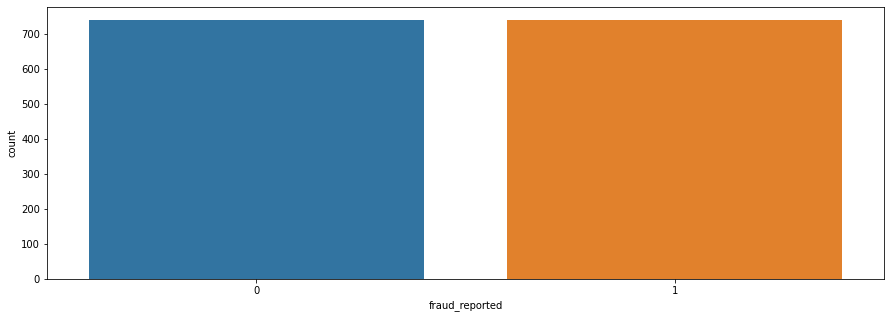

In [121]:
plt.figure(figsize = (15,5))
sns.countplot(y)

## Standard Scalling¶

In [122]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [123]:
scaler_columns = ['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'injury_claim',
 'property_claim',
 'vehicle_claim']  # taking numerical columns

In [124]:
x[scaler_columns] = sc.fit_transform(x[scaler_columns])

In [125]:
x = pd.DataFrame(data = x, columns = x.columns)

In [126]:
x.head(5)

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_month,policy_bind_year,incident_date_month,policy_state_0.0,policy_state_1.0,policy_state_2.0,policy_csl_0.0,policy_csl_1.0,policy_csl_2.0,umbrella_limit_0.0,umbrella_limit_1.0,umbrella_limit_2.0,umbrella_limit_3.0,umbrella_limit_4.0,umbrella_limit_5.0,umbrella_limit_6.0,umbrella_limit_7.0,insured_sex_0.0,insured_sex_1.0,insured_education_level_0.0,insured_education_level_1.0,insured_education_level_2.0,insured_education_level_3.0,insured_education_level_4.0,insured_education_level_5.0,insured_education_level_6.0,insured_occupation_0.0,insured_occupation_1.0,insured_occupation_2.0,insured_occupation_3.0,insured_occupation_4.0,insured_occupation_5.0,insured_occupation_6.0,insured_occupation_7.0,insured_occupation_8.0,insured_occupation_9.0,insured_occupation_10.0,insured_occupation_11.0,insured_occupation_12.0,insured_occupation_13.0,insured_hobbies_0.0,insured_hobbies_1.0,insured_hobbies_2.0,insured_hobbies_3.0,insured_hobbies_4.0,insured_hobbies_5.0,insured_hobbies_6.0,insured_hobbies_7.0,insured_hobbies_8.0,insured_hobbies_9.0,insured_hobbies_10.0,insured_hobbies_11.0,insured_hobbies_12.0,insured_hobbies_13.0,insured_hobbies_14.0,insured_hobbies_15.0,insured_hobbies_16.0,insured_hobbies_17.0,insured_hobbies_18.0,insured_hobbies_19.0,insured_relationship_0.0,insured_relationship_1.0,insured_relationship_2.0,insured_relationship_3.0,insured_relationship_4.0,insured_relationship_5.0,incident_type_0.0,incident_type_1.0,incident_type_2.0,incident_type_3.0,collision_type_0.0,collision_type_1.0,collision_type_2.0,incident_severity_0.0,incident_severity_1.0,incident_severity_2.0,incident_severity_3.0,authorities_contacted_0.0,authorities_contacted_1.0,authorities_contacted_2.0,authorities_contacted_3.0,authorities_contacted_4.0,incident_state_0.0,incident_state_1.0,incident_state_2.0,incident_state_3.0,incident_state_4.0,incident_state_5.0,incident_state_6.0,incident_city_0.0,incident_city_1.0,incident_city_2.0,incident_city_3.0,incident_city_4.0,incident_city_5.0,incident_city_6.0,property_damage_0.0,property_damage_1.0,police_report_available_0.0,police_report_available_1.0,auto_make_0.0,auto_make_1.0,auto_make_2.0,auto_make_3.0,auto_make_4.0,auto_make_5.0,auto_make_6.0,auto_make_7.0,auto_make_8.0,auto_make_9.0,auto_make_10.0,auto_make_11.0,auto_make_12.0,auto_make_13.0
0,1.068853,1.021050,0.062577,0.670641,1.140683,1.128686,-0.995574,-0.916107,0.061666,0.517224,-0.080707,1.058770,0.684017,2004,10,2014,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0.289729,0.428799,1.326579,-0.238244,-0.992824,1.128686,-0.497658,-0.916107,-1.367567,-1.548607,-1.754542,-1.793800,-2.081420,2007,6,2006,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,-0.561894,-1.180838,1.326579,0.697477,1.062477,1.128686,-0.658271,1.206154,1.199844,1.340223,0.157240,-0.738517,-1.030657,2007,6,2000,2,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0.518065,0.322577,1.326579,0.708674,1.124576,-1.039069,-0.995574,-0.916107,0.061666,0.517224,-0.116203,-0.151714,0.601130,2014,5,1990,10,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0.289729,0.63

## Feature Selection

In [437]:

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [127]:
class best_model:
    def best_fit(x, y, model):
        random_state_values = []
        for i in range(0,200):
            x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = i, test_size = 0.30)
            model.fit(x_train, y_train)
            pred_train = model.predict(x_train)
            pred_test = model.predict(x_test)
            training = accuracy_score(pred_train, y_train)
            testing = accuracy_score(pred_test, y_test)
            
            if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
            #if round(accuracy_score(y_train, pred_train)*100,1) == round(accuracy_score(y_test, pred_test)*100,1):
                print("At random_state:-", i)
                print("Training accuracy_score is:-", accuracy_score(pred_train, y_train)*100)
                print("Testing accuracy_score is:-", accuracy_score(pred_test, y_test)*100)
                print("\n")
                random_state_values.append(i)
        print("Best fit random_state_values", random_state_values)
    
    
    def final_model(x, y, model, i):
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = i)
        model.fit(x_train, y_train)
        pred_train = model.predict(x_train)
        pred_test = model.predict(x_test)
        print("At random state", i , "model giving best accuracy score","\n")
        Train_accuracy = accuracy_score(pred_train, y_train)
        Test_accuracy = accuracy_score(pred_test, y_test)
        print('Training accuracy:- ', Train_accuracy*100)
        print('Testing accuracy:- ', Test_accuracy*100)
        print("\n")
        print('--------------------------------------')
        print('Confusion Matrix')
        print(confusion_matrix(pred_test, y_test) )
        print("\n")
        print('Classification Report')
        print(classification_report(pred_test, y_test) )
        

    def cross_val_score(model, x, y):
        for value in range(2,10):
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")


## Model 1 Logisitc Regression

In [451]:
model = LogisticRegression()

In [452]:
best_model.best_fit(x, y, model)   #finding best random state

At random_state:- 0
Training accuracy_score is:- 88.03088803088804
Testing accuracy_score is:- 87.61261261261262


At random_state:- 10
Training accuracy_score is:- 87.45173745173746
Testing accuracy_score is:- 87.38738738738738


At random_state:- 11
Training accuracy_score is:- 87.35521235521236
Testing accuracy_score is:- 87.38738738738738


At random_state:- 17
Training accuracy_score is:- 88.41698841698842
Testing accuracy_score is:- 87.61261261261262


At random_state:- 18
Training accuracy_score is:- 88.12741312741312
Testing accuracy_score is:- 87.61261261261262


At random_state:- 19
Training accuracy_score is:- 88.12741312741312
Testing accuracy_score is:- 87.61261261261262


At random_state:- 20
Training accuracy_score is:- 87.83783783783784
Testing accuracy_score is:- 88.28828828828829


At random_state:- 33
Training accuracy_score is:- 88.41698841698842
Testing accuracy_score is:- 87.83783783783784


At random_state:- 52
Training accuracy_score is:- 87.83783783783784
Testi

#### Model giving best accuracy score at random state value 110

In [453]:
best_model.final_model(x, y, model, 110)

At random state 110 model giving best accuracy score 

Training accuracy:-  88.22393822393822
Testing accuracy:-  88.28828828828829


--------------------------------------
Confusion Matrix
[[197  39]
 [ 13 195]]


Classification Report
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       236
           1       0.83      0.94      0.88       208

    accuracy                           0.88       444
   macro avg       0.89      0.89      0.88       444
weighted avg       0.89      0.88      0.88       444



In [456]:
best_model.cross_val_score(model, x, y)

cross_val_score 79.72972972972974 at cv = 2 

cross_val_score 79.41039601656662 at cv = 3 

cross_val_score 82.63513513513514 at cv = 4 

cross_val_score 84.1891891891892 at cv = 5 

cross_val_score 84.40692099228684 at cv = 6 

cross_val_score 85.56322734763225 at cv = 7 

cross_val_score 86.08108108108108 at cv = 8 

cross_val_score 85.8392871807506 at cv = 9 



## Model 2 GaussianNB

In [457]:
model = GaussianNB()

In [458]:
best_model.best_fit(x, y, model)  #finding best random state

At random_state:- 2
Training accuracy_score is:- 88.32046332046332
Testing accuracy_score is:- 87.61261261261262


At random_state:- 17
Training accuracy_score is:- 87.25868725868726
Testing accuracy_score is:- 87.38738738738738


At random_state:- 28
Training accuracy_score is:- 87.25868725868726
Testing accuracy_score is:- 86.93693693693693


At random_state:- 45
Training accuracy_score is:- 87.16216216216216
Testing accuracy_score is:- 87.16216216216216


At random_state:- 52
Training accuracy_score is:- 87.16216216216216
Testing accuracy_score is:- 86.71171171171171


At random_state:- 53
Training accuracy_score is:- 87.25868725868726
Testing accuracy_score is:- 87.16216216216216


At random_state:- 54
Training accuracy_score is:- 87.16216216216216
Testing accuracy_score is:- 87.16216216216216


At random_state:- 58
Training accuracy_score is:- 87.64478764478764
Testing accuracy_score is:- 88.28828828828829


At random_state:- 72
Training accuracy_score is:- 87.16216216216216
Testi

#### Model giving best accuracy score at random state value 144

In [459]:
best_model.final_model(x, y, model, 144)

At random state 144 model giving best accuracy score 

Training accuracy:-  87.93436293436294
Testing accuracy:-  87.61261261261262


--------------------------------------
Confusion Matrix
[[223  48]
 [  7 166]]


Classification Report
              precision    recall  f1-score   support

           0       0.97      0.82      0.89       271
           1       0.78      0.96      0.86       173

    accuracy                           0.88       444
   macro avg       0.87      0.89      0.87       444
weighted avg       0.89      0.88      0.88       444



In [460]:
best_model.cross_val_score(model, x, y)

cross_val_score 76.01351351351352 at cv = 2 

cross_val_score 79.81580179188805 at cv = 3 

cross_val_score 82.5 at cv = 4 

cross_val_score 83.71621621621621 at cv = 5 

cross_val_score 83.46417168625128 at cv = 6 

cross_val_score 83.88657528646797 at cv = 7 

cross_val_score 84.66216216216216 at cv = 8 

cross_val_score 85.17697298185102 at cv = 9 



## Model 3 Support Vector Classifier

In [461]:
model = SVC()

In [462]:
best_model.best_fit(x, y, model)  #finding best random state

At random_state:- 2
Training accuracy_score is:- 61.100386100386096
Testing accuracy_score is:- 61.03603603603604


At random_state:- 3
Training accuracy_score is:- 50.0965250965251
Testing accuracy_score is:- 49.77477477477478


At random_state:- 10
Training accuracy_score is:- 50.0965250965251
Testing accuracy_score is:- 49.77477477477478


At random_state:- 22
Training accuracy_score is:- 50.19305019305019
Testing accuracy_score is:- 49.549549549549546


At random_state:- 29
Training accuracy_score is:- 50.0965250965251
Testing accuracy_score is:- 49.77477477477478


At random_state:- 34
Training accuracy_score is:- 50.19305019305019
Testing accuracy_score is:- 49.549549549549546


At random_state:- 40
Training accuracy_score is:- 50.0965250965251
Testing accuracy_score is:- 49.77477477477478


At random_state:- 41
Training accuracy_score is:- 50.0965250965251
Testing accuracy_score is:- 49.77477477477478


At random_state:- 47
Training accuracy_score is:- 50.19305019305019
Testing 

#### Model giving best accuracy score at random state value 173

In [463]:
best_model.final_model(x, y, model, 173)

At random state 173 model giving best accuracy score 

Training accuracy:-  58.78378378378378
Testing accuracy:-  58.78378378378378


--------------------------------------
Confusion Matrix
[[114  75]
 [108 147]]


Classification Report
              precision    recall  f1-score   support

           0       0.51      0.60      0.55       189
           1       0.66      0.58      0.62       255

    accuracy                           0.59       444
   macro avg       0.59      0.59      0.59       444
weighted avg       0.60      0.59      0.59       444



In [464]:
best_model.cross_val_score(model, x, y)

cross_val_score 54.729729729729726 at cv = 2 

cross_val_score 51.34939079638556 at cv = 3 

cross_val_score 57.229729729729726 at cv = 4 

cross_val_score 57.56756756756756 at cv = 5 

cross_val_score 52.57507433373928 at cv = 6 

cross_val_score 52.02092461772333 at cv = 7 

cross_val_score 49.72972972972973 at cv = 8 

cross_val_score 55.420875420875426 at cv = 9 



## Model 4 AdaBoostClassifier

In [465]:
model = AdaBoostClassifier()

In [469]:
best_model.best_fit(x, y, model)  #finding best random state

At random_state:- 29
Training accuracy_score is:- 89.47876447876449
Testing accuracy_score is:- 88.51351351351352


At random_state:- 49
Training accuracy_score is:- 89.1891891891892
Testing accuracy_score is:- 88.51351351351352


At random_state:- 111
Training accuracy_score is:- 90.92664092664093
Testing accuracy_score is:- 90.54054054054053


At random_state:- 158
Training accuracy_score is:- 89.28571428571429
Testing accuracy_score is:- 88.73873873873875


Best fit random_state_values [29, 49, 111, 158]


#### Model giving best accuracy score at random state value 111

In [467]:
best_model.final_model(x, y, model, 111)

At random state 111 model giving best accuracy score 

Training accuracy:-  90.92664092664093
Testing accuracy:-  90.54054054054053


--------------------------------------
Confusion Matrix
[[201  22]
 [ 20 201]]


Classification Report
              precision    recall  f1-score   support

           0       0.91      0.90      0.91       223
           1       0.90      0.91      0.91       221

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444



In [468]:
best_model.cross_val_score(model, x, y)

cross_val_score 80.47297297297298 at cv = 2 

cross_val_score 79.07260349344261 at cv = 3 

cross_val_score 84.45945945945945 at cv = 4 

cross_val_score 85.33783783783782 at cv = 5 

cross_val_score 84.74320573165245 at cv = 6 

cross_val_score 84.95516153345 at cv = 7 

cross_val_score 85.74324324324326 at cv = 8 

cross_val_score 86.51350907448467 at cv = 9 



## Model 5 DecisionTreeClassifier

In [470]:
model = DecisionTreeClassifier()

In [471]:
best_model.best_fit(x, y, model)  #finding best random state

Best fit random_state_values []


In [475]:
for i in range(150,200):
            x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = i, test_size = 0.30)
            model.fit(x_train, y_train)
            pred_train = model.predict(x_train)
            pred_test = model.predict(x_test)
            training = accuracy_score(pred_train, y_train)
            testing = accuracy_score(pred_test, y_test)
            
            #if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
            #if round(accuracy_score(y_train, pred_train)*100,1) == round(accuracy_score(y_test, pred_test)*100,1):
            print("At random_state:-", i)
            print("Training accuracy_score is:-", accuracy_score(pred_train, y_train)*100)
            print("Testing accuracy_score is:-", accuracy_score(pred_test, y_test)*100)
            print("\n")


At random_state:- 150
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 84.45945945945947


At random_state:- 151
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 83.33333333333334


At random_state:- 152
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 82.2072072072072


At random_state:- 153
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 83.33333333333334


At random_state:- 154
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 83.55855855855856


At random_state:- 155
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 82.43243243243244


At random_state:- 156
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 85.58558558558559


At random_state:- 157
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 84.23423423423422


At random_state:- 158
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 84.90990990990991


At random_state:- 159
Training accuracy_score is:- 100.0

#### Checking with Decision Tree classfier we find that model being overfitted as training accuracy is 100 percent while testing within 85 percent hence we can't consider it.

## Finalizing Best Models

In [482]:
# models                 accuracy_score_training  accuracy_score_training    CV score        CV state    Differences in accuracy

# LogisticRegression       88.22393822393822       88.28828828828829      86.08108108108108     8      0.06435006435006585
# GaussianNB               87.93436293436294       87.61261261261262      85.17697298185102     9      0.32175032175031504
# SupportVectorClassifier   58.78378378378378      58.78378378378378      57.56756756756756     5      0.0
# AdaboostClassifier        90.92664092664093      90.54054054054053      86.51350907448467     9      0.3861003861003951

### Observations:-
- LogisticRegression: Model shows similar training and testing accuracy but accuracy score is very less than other models hence we can't consider it for model building.


- GassianNB: Model shows similar training and testing accuracy but accuracy score is very less hence we can't consider it for model building.


- SupportVectorClassifier: Model shows similar training and testing accuracy but accuracy score is very less hence we can't consider it for model building.



- AdaboostClassifier: Model show higher accuracy also having less difference in accuracy of testing and training. Hence we can't consider it.


### From above Machine Learning Models we find that AdaBoostClassifer show highest accuracy with rangeable cv score with lower differences in accuracy score.
Hence we are selecting it for model learning

### Ensemble Technique

## Hyper Parameter Tuning

In [484]:
# using hyper parameter tuning for Support Vector Classifier to find out best criterion

model = AdaBoostClassifier()

#default params: base_estimator=None,
#     *, n_estimators=50,
#     learning_rate=1.0,
#     algorithm='SAMME.R',
#     random_state=None,

param = {'base_estimator' : [LogisticRegression(), None], 
             'learning_rate' : [0.1, 0.01, 1],
             'algorithm' : ['SAMME', 'SAMME.R'],
             'n_estimators': [100, 50, 10]}

gd = GridSearchCV(model, param_grid=param, cv = 9)
gd.fit(x, y)
gd.best_params_

# {'algorithm': 'SAMME.R',
#  'base_estimator': None,
#  'learning_rate': 1,
#  'n_estimators': 100}

{'algorithm': 'SAMME.R',
 'base_estimator': None,
 'learning_rate': 1,
 'n_estimators': 100}

## Final Model AdaBoostClassifier

In [487]:
model = AdaBoostClassifier(algorithm='SAMME.R', base_estimator = None, learning_rate = 1 )

In [488]:
best_model.best_fit(x, y, model)  #finding best random state with best params

At random_state:- 29
Training accuracy_score is:- 89.47876447876449
Testing accuracy_score is:- 88.51351351351352


At random_state:- 49
Training accuracy_score is:- 89.1891891891892
Testing accuracy_score is:- 88.51351351351352


At random_state:- 111
Training accuracy_score is:- 90.92664092664093
Testing accuracy_score is:- 90.54054054054053


At random_state:- 158
Training accuracy_score is:- 89.28571428571429
Testing accuracy_score is:- 88.73873873873875


Best fit random_state_values [29, 49, 111, 158]


#### At Random State 111 model gives best accuracy score

In [489]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 111)
model.fit(x_train, y_train)
pred_train = model.predict(x_train)
pred_test = model.predict(x_test)
print("At random state", 11 , "model giving best accuracy score","\n")
Train_accuracy = accuracy_score(pred_train, y_train)
Test_accuracy = accuracy_score(pred_test, y_test)
print('Training accuracy:- ', Train_accuracy*100)
print('Testing accuracy:- ', Test_accuracy*100)
print("\n")
print('--------------------------------------')
print('Confusion Matrix')
print(confusion_matrix(pred_test, y_test) )
print("\n")
print('Classification Report')
print(classification_report(pred_test, y_test) )   # at random state 60 model shows best accuracy

At random state 11 model giving best accuracy score 

Training accuracy:-  90.92664092664093
Testing accuracy:-  90.54054054054053


--------------------------------------
Confusion Matrix
[[201  22]
 [ 20 201]]


Classification Report
              precision    recall  f1-score   support

           0       0.91      0.90      0.91       223
           1       0.90      0.91      0.91       221

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444



### Using Predict Proba function for finding accuracy target variable

In [490]:
final_pred_prob = model.predict_proba(x_test)[:,1]

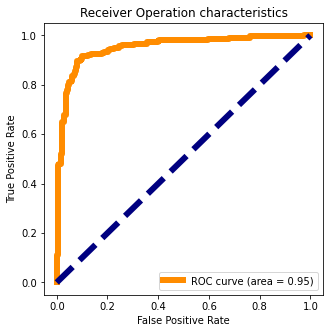

In [491]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresolds = roc_curve(y_test, final_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize = (5,5))
plt.plot(fpr, tpr, color = 'darkorange', lw = 6, label = "ROC curve (area = %0.2f)" % roc_auc)
plt.plot([0,1],[0,1], color = 'navy', lw = 6, linestyle = '--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operation characteristics")
plt.legend(loc = "lower right")
plt.show()

### Deploy Model

In [494]:
import pickle

filename = "Insurance_claim_predictor.pkl"
pickle.dump(model, open(filename, 'wb'))

### Loading Model

In [496]:
load = pickle.load(open('Insurance_claim_predictor.pkl', 'rb'))
result = load.score(x_test, y_test)
print(result)

0.9054054054054054


### Conclusion

In [497]:
conclusion = pd.DataFrame()
conclusion['Predicted fraud_report'] = np.array(model.predict(x_test))
conclusion['Actual fraud_report'] = np.array(y_test)

In [500]:
conclusion.sample(25)

,Predicted fraud_report,Actual fraud_report
440,1,1
348,0,0
69,0,0
350,1,1
88,0,0
215,0,0
210,0,0
206,1,0
67,0,0
416,1,1
